# Preliminaries

## Import Libraries

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scikitplot as skplt
from sklearn import metrics

## Import Datasets

In [65]:
path_to_datasets = '../datasets'
path_to_cleaned = '/datasets_cleaned'

join_dataframe = pd.read_csv(f'{path_to_datasets}{path_to_cleaned}/join_dataframe.csv')
join_external_dataframe = pd.read_csv(f'{path_to_datasets}{path_to_cleaned}/join_external_dataframe.csv')

pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [66]:
join_dataframe.head()

,year,month,week,day,state,congressional_district,city_or_county,latitude,longitude,incidents_state_year,incidents_city_year,severity_index,n_participants,n_killed,n_injured,n_unharmed,n_arrested,percentage_males,percentage_adults,age_range_indicator,age_combined_index,incident_characteristics1,povertyPercentage,poverty_difference,poverty_comparison,party,percentage_votes
0,2015,5,18,2,Indiana,7.0,Indianapolis,39.8322,-86.2492,719,211,1.0,1.0,0.0,1.0,0.0,0.0,100.0,100.0,0.0,19.000000,Shot - Wounded/Injured,12.300000,9.500000,Below US Average,NaN,NaN
1,2017,4,14,3,Pennsylvania,5.0,Kane,41.6645,-78.7856,1739,2,1.0,1.0,1.0,0.0,0.0,0.0,100.0,100.0,0.0,62.000000,"Shot - Dead (murder, accidental, suicide)",10.500000,9.000000,Below US Average,NaN,NaN
2,2016,10,41,15,District of Columbia,1.0,Washington,38.9030,-76.9820,261,260,0.5,2.0,0.0,1.0,0.0,0.0,50.0,50.0,4.0,29.982022,Shot - Wounded/Injured,14.900000,12.600000,Above US Average,NaN,NaN
3,2030,6,24,14,Pennsylvania,14.0,Pittsburgh,40.4621,-80.0308,288,45,0.5,2.0,0.0,1.0,1.0,0.0,50.0,50.0,4.0,29.982022,Shot - Wounded/Injured,12.577497,10.215692,NaN,NaN,NaN
4,2014,1,3,18,North Carolina,13.0,Wayne County,35.1847,-77.9527,1103,3,1.0,1.0,0.0,1.0,0.0,0.0,100.0,100.0,0.0,65.000000,Shot - Wounded/Injured,15.300000,11.600000,Above US Average,REPUBLICAN,57.30772


# Clustering

In this large section we will discuss about clustering.

### Preparation

In order to work on the clustering the first thing we do is create two dataframes, **df** and **df2**, of which the first one is used to aggregate numerical attributes and the second one to gather categorical ones. This will be useful later to better analyze this two types of data types.

In [67]:
numeric_columns_to_clusterize = ['incidents_state_year', 'severity_index',
                                 'percentage_males', 'percentage_adults',
                                 'age_combined_index', 'povertyPercentage', 'percentage_votes']
n_components_num = 7

categorical_columns_to_clusterize = ['state']
n_components_cat = 1

df = join_dataframe[numeric_columns_to_clusterize].copy()
df2 = join_dataframe[categorical_columns_to_clusterize].copy()

To work with clustering is absolutely required that the data is complete and for this reason is mandatory that there are no null values. That's why we make this check here on both the dataframes.

In [68]:
print(df.isnull().sum())
print()
print(df2.isnull().sum())

incidents_state_year         0
severity_index               0
percentage_males             0
percentage_adults            0
age_combined_index           0
povertyPercentage            0
percentage_votes        101526
dtype: int64

state    0
dtype: int64


There are null columns, which result from the join of the dataframes, and which we then move on to eliminate in order to work with clustering.

In [69]:
df.dropna(inplace=True)
df2.dropna(inplace=True)

df.reset_index(drop=True, inplace=True)
df2.reset_index(drop=True, inplace=True)

Clustering aggregates various attributes and works with them at the same time, creating clusters that take dimensionality equal to the number of attributes used. This means that the clusters can then be represented completely only in a multidimensional space. But it's necessary, for limitations in our hardware mostly, to choose couples of attributes and limit ourselves to two-dimensional representations.

That's why we use here another library, very similar to scikit-learn, that lets us, given a dataframe, represent all the scatterplots formed from all the possible pairings of attributes. This library is called **seaborn** and further information can be found in the [official documentation](https://seaborn.pydata.org/).

The first command we can give is **pairplot()**. This command prints for each pair of columns in the dataframe passed as input a scatterplot of the data. We do this in such a way as to check visually from the outset whether there are column pairs that seem to be more suitable than others for the study of cluster formation.

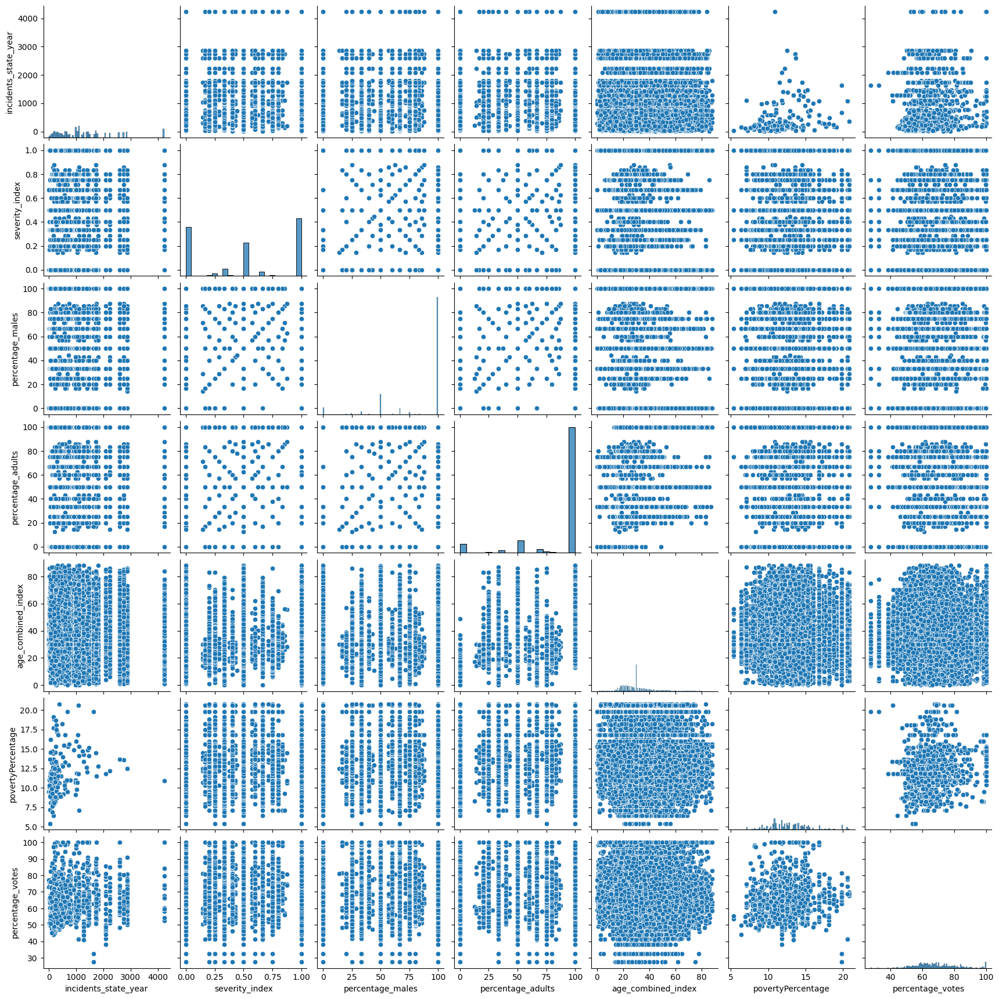

In [70]:
import seaborn as sns
import warnings

warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
sns.pairplot(df)

## Normalizing

This section delves into the concept of normalizing data, emphasizing its significance in enhancing the performance of clustering algorithms. Two widely used normalization techniques, namely **Standard Scaling** and **Min-Max Scaling**, will be explored in detail. These scalers play a pivotal role in transforming data into a standardized and comparable format, setting the stage for more accurate and reliable clustering outcomes. The first thing we do in order to work with these two methods is to import them from the library.

As we unravel the intricacies of normalization, we will elucidate the principles behind these scaling methods: their respective advantages and scenarios where one may be preferred over the other. By the end of this section, readers will gain a comprehensive understanding of the normalization process and its indispensable role in preparing data for clustering analysis.

In [71]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

The *StandardScaler* is a preprocessing technique provided by the **scikit-learn** library in Python - specifically within the **sklearn.preprocessing** module. It is designed to standardize the features of a dataset by removing the mean and scaling to unit variance. This process is crucial in scenarios where the input features of a dataset have different scales, as it ensures that each feature contributes equally to the analysis. The StandardScaler operates on a per-feature basis, independently scaling each feature.

The **fit()** method computes the mean and standard deviation necessary for scaling. However, the method still does not change the values in our dataframe. To do this we will have to use the **transform()** command, which we explain below. We still print the values of df so that we can show how they change only after using the new function.

In [72]:
scaler = StandardScaler()
scaler.fit(df.values)

df.head().values

array([[1.10300000e+03, 1.00000000e+00, 1.00000000e+02, 1.00000000e+02,
        6.50000000e+01, 1.53000000e+01, 5.73077195e+01],
       [2.76000000e+02, 6.00000000e-01, 1.00000000e+02, 1.00000000e+02,
        2.55000000e+01, 1.75000000e+01, 6.94732334e+01],
       [5.85000000e+02, 0.00000000e+00, 1.00000000e+02, 0.00000000e+00,
        2.99820223e+01, 9.90000000e+00, 6.21483682e+01],
       [1.03400000e+03, 1.00000000e+00, 1.00000000e+02, 1.00000000e+02,
        6.50000000e+01, 1.07000000e+01, 5.98576187e+01],
       [1.28200000e+03, 3.33333333e-01, 1.00000000e+02, 1.00000000e+02,
        2.87500000e+01, 1.34000000e+01, 6.73425162e+01]])

The **transform()** method scales the input data by subtracting the mean and dividing by the standard deviation.

In [73]:
scaler.transform(df.head().values)

array([[-0.21798252,  1.14941388,  0.5247438 ,  0.45223553,  3.04379553,
         0.86564458, -0.8713666 ],
       [-1.01696493,  0.19064971,  0.5247438 ,  0.45223553, -0.39625871,
         1.65118521,  0.07954802],
       [-0.71843342, -1.24749654,  0.5247438 , -3.14625141, -0.00591947,
        -1.06250058, -0.4929984 ],
       [-0.2846449 ,  1.14941388,  0.5247438 ,  0.45223553,  3.04379553,
        -0.77684945, -0.67205431],
       [-0.04504679, -0.4485264 ,  0.5247438 ,  0.45223553, -0.11321627,
         0.18722314, -0.086999  ]])

The **inverse_transform()** as the name suggests reverts the changes made to the data by the transform method. We use this command because, as we will see, the normalization method we are going to use throughout the rest of the noteboook is Min-Max Scaling. In fact, this whole first part about the method served only for informational purposes, to show what one of the most widely used normalization methods does and how it works.

In [74]:
scaler.inverse_transform(scaler.transform(df.head().values))

array([[1.10300000e+03, 1.00000000e+00, 1.00000000e+02, 1.00000000e+02,
        6.50000000e+01, 1.53000000e+01, 5.73077195e+01],
       [2.76000000e+02, 6.00000000e-01, 1.00000000e+02, 1.00000000e+02,
        2.55000000e+01, 1.75000000e+01, 6.94732334e+01],
       [5.85000000e+02, 0.00000000e+00, 1.00000000e+02, 0.00000000e+00,
        2.99820223e+01, 9.90000000e+00, 6.21483682e+01],
       [1.03400000e+03, 1.00000000e+00, 1.00000000e+02, 1.00000000e+02,
        6.50000000e+01, 1.07000000e+01, 5.98576187e+01],
       [1.28200000e+03, 3.33333333e-01, 1.00000000e+02, 1.00000000e+02,
        2.87500000e+01, 1.34000000e+01, 6.73425162e+01]])

The *MinMaxScaler* is a fundamental feature scaling method provided by the **scikit-learn** library in Python, specifically within the sklearn.preprocessing module. This scaler, differently to the StandardScaler, is designed to transform and scale input data, ensuring that it falls within a specified range, typically [0, 1]. This normalization is particularly useful when dealing with algorithms that are sensitive to the scale of input features, such as clustering algorithms.

The *fit_transform()* method in the MinMaxScaler class of scikit-learn combines two essential steps in preprocessing: fitting and transforming the data. Let's delve into more detail about how the fit_transform method works:
- The first step is to fit the MinMaxScaler to the data. The fitting process involves calculating the minimum and maximum values for each feature in the dataset. These minimum and maximum values are used to determine the scaling parameters necessary to transform the data into the desired range.
- After the fitting step, the fit_transform method applies the calculated scaling parameters to transform the data. Each feature in the dataset is scaled individually based on its minimum and maximum values. Here is the formula for scaling each feature *x* in the dataset to the range *[a,b]*: 
$$ x' = a + \frac{((x - \min(x))}{\max(x) - \min(x))} \cdot (b - a) $$

We now create both the scalers to then do the tests using both and so compare them.

In [75]:
scaler = StandardScaler()
X_std = scaler.fit_transform(df.values)

In [76]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(df.values)

This part of the code slices the first five rows of the transformed data *X*. It is a way to inspect the result and see how the data looks after scaling.

In [77]:
X_minmax[:4]

array([[0.25928555, 1.        , 1.        , 1.        , 0.73863636,
        0.64285714, 0.41114333],
       [0.06363851, 0.6       , 1.        , 1.        , 0.28977273,
        0.78571429, 0.57894285],
       [0.13674   , 0.        , 1.        , 0.        , 0.3407048 ,
        0.29220779, 0.47791063],
       [0.24296191, 1.        , 1.        , 1.        , 0.73863636,
        0.34415584, 0.44631421]])

## PCA 

**Principal Component Analysis** is a tecnique that can be useful when we can't plot the data because it has too many dimensions, or when there are no data concentrations or clear separation in groups. When those situations occur, it's recommended to try reducing data dimensions with this method. PCA will reduce the dimensions of our data while trying to preserve as much of its information as possible. Let's first get an idea about how PCA works, and then we can choose how many data dimensions we will reduce our data to.

For each pair of features, PCA sees if the greater values of one variable correspond with the greater values of the other variable, and it does the same for the lesser values. So, it essentially computes how much the feature values vary towards one another - we call that their *covariance*. Those results are then organized into a matrix, called **covariance matrix**.

After getting the covariance matrix, PCA tries to find a linear combination of features that best explains it - it fits linear models until it identifies the one that explains the maximum amount of variance. With the best line - linear combination - found, PCA gets the directions of its axes, called *eigenvectors*, and its linear coefficients, the *eigenvalues*. The combination of the eigenvectors and eigenvalues - or axes directions and coefficients - are the Principal Components of PCA. And that is when we can choose our number of dimensions based on the explained variance of each feature, by understanding which principal components we want to keep or discard based on how much variance they explain.

After obtaining the principal components, PCA uses the eigenvectors to form a vector of features that reorient the data from the original axes to the ones represented by the principal components - that's how the data dimensions are reduced.

In [78]:
from sklearn.decomposition import PCA

pca = PCA(n_components=n_components_num)
pca.fit_transform(X_std)
pca.explained_variance_ratio_.cumsum()

array([0.20012351, 0.38129161, 0.53728199, 0.67227356, 0.79670266,
       0.91017768, 1.        ])

In [79]:
pca = PCA(n_components=n_components_num)
pca.fit_transform(X_minmax)
pca.explained_variance_ratio_.cumsum()

array([0.38039717, 0.56157419, 0.71146561, 0.83710215, 0.90823233,
       0.96898538, 1.        ])

Seeing that the minmax scaler gives way better results we will use this for the PCA.

We can also see that the first dimension explains 55% of the data, and when combined with the second dimension, it explains 80%. This means that the first two dimensions already explain 80% of our data. We can then apply a PCA with 2 components, get our principal components and plot them, to see what comes out - we can se the result below.

Finding few attributes that together explain high percentages of data is the goal when using PCA. But our 80% is not so good as percentage so we will use 3, this way we reach 90% that is obviously better.

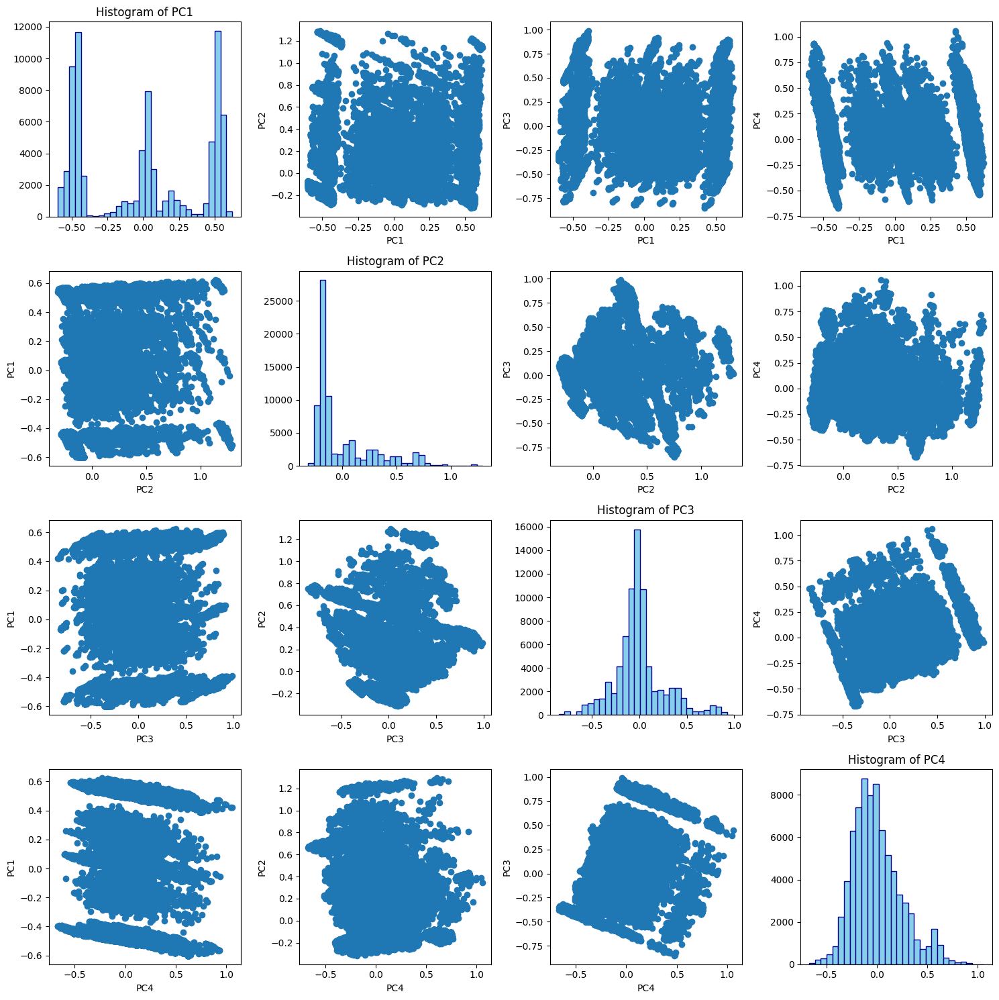

In [80]:
pca = PCA(n_components=4)
pcs = pca.fit_transform(X_minmax)

n_components = pca.n_components_
fig, axes = plt.subplots(n_components, n_components, figsize=(15, 15))

for i in range(n_components):
    for j in range(n_components):
        if i == j:
            axes[i, j].hist(pcs[:, i], bins=30, color='skyblue', ec='darkblue')
            axes[i, j].set_title(f'Histogram of PC{i+1}')
        else:
            axes[i, j].scatter(pcs[:, i], pcs[:, j])
            axes[i, j].set_xlabel(f'PC{i+1}')
            axes[i, j].set_ylabel(f'PC{j+1}')

# Aggiustamenti per l'aspetto della griglia
plt.tight_layout()
plt.show()

## K-Means

Clustering represents an essential component in the realm of unsupervised learning, significantly contributing to the understanding of hidden structures within data. In this section, we will focus on one of the most widely used clustering techniques, **K-Means**, and explore its implementation through the scikit-learn library.

K-Means is a data partitioning algorithm that aims to divide a set of observations into homogeneous groups, known as clusters, based on similarities among them. Its conceptual simplicity and robustness make it a valuable tool in numerous disciplines, from customer segmentation in marketing analysis to image classification in computer science. In this section, we will delve into the theoretical foundations of K-means, examining the cluster formation process and discussing practical considerations related to its implementation using the versatile scikit-learn library.

In [81]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

The **KMeans** object, as expected, forms the foundation for using this algorithm with scikit-learn. Particularly in the usage highlighted here, the following parameters stand out:

- *n_clusters=4*: Specifies the desired number of clusters. In our case, we aim to group the data into 4 distinct clusters. This parameter is crucial as K-Means will partition the data into a specified number of groups based on similarities among observations.

- *n_init=10*: Indicates the number of times the K-Means algorithm will be run with different centroid initializations. The K-Means algorithm may converge to local optimal solutions depending on the initial choice of centroids. Using multiple initializations - here 10 - helps mitigate this issue, allowing for the selection of the best result among various executions.

- *max_iter=100*: Represents the maximum number of iterations allowed for each individual run of the K-Means algorithm. The algorithm relies on iterative minimization of the sum of squares of distances between data points and cluster centroids. Setting a maximum iteration limit prevents the algorithm from running indefinitely in cases where convergence is challenging.

- *random_state=42*: Provides a seed for the random number generator. This is useful for making the experiment reproducible. Two executions with the same seed will yield the same results, ensuring consistency and reproducibility.

As we can see in the code below we run the K-Means algorithm in two different ways: the classical one on our columns, and the one on our columns after applying PCA.

In [82]:
kmeans_std = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=42)
kmeans_std.fit(X_std)

kmeans_minmax = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=42)
kmeans_minmax.fit(X_minmax)

kmeans_pca = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=42)
kmeans_pca.fit(pcs)

KMeans(max_iter=100, n_clusters=4, n_init=10, random_state=42)

But how do we choose the number of clusters? Putting 4 clusters on top is totally causal, and we actually wonder if there is a way to be able to choose the optimal number of clusters given a set of points. Methods for doing this actually exist. The method we are going to use is known as the *Elbow Method*.. his involves training the K-Means model with a range of cluster values and calculating the **inertia** - sum of the square distances of the instances from the cluster center, also know as **SSE** - for each cluster value. Once this is done, one then looks for the point at which the inertia begins to change most slowly, creating an elbow curve. This point is considered the optimal number of clusters.

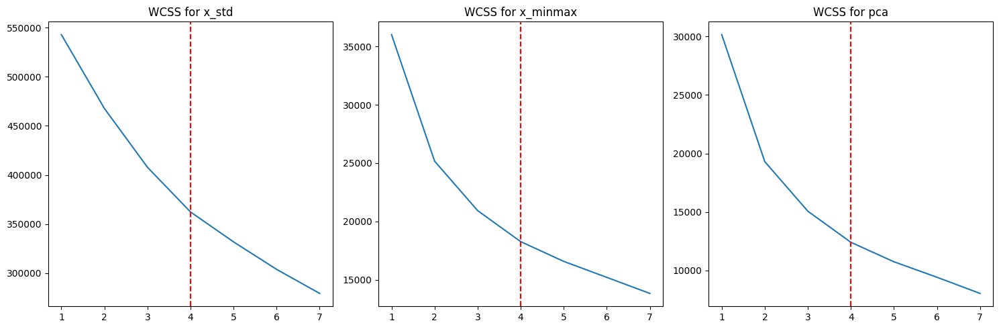

In [83]:
wcss_std = []
ks = range(1, 8)

# Calculate WCSS for x_std
for number_of_clusters in ks:
    kmeans_std = KMeans(n_clusters=number_of_clusters, random_state=42, n_init=10)
    kmeans_std.fit(X_std)
    wcss_std.append(kmeans_std.inertia_)

# Calculate WCSS for x_minmax
wcss_minmax = []
for number_of_clusters in ks:
    kmeans_minmax = KMeans(n_clusters=number_of_clusters, random_state=42, n_init=10)
    kmeans_minmax.fit(X_minmax)
    wcss_minmax.append(kmeans_minmax.inertia_)

# Calculate WCSS for pcs
wcss_pcs = []
for number_of_clusters in ks:
    kmeans_pcs = KMeans(n_clusters=number_of_clusters, random_state=42, n_init=10)
    kmeans_pcs.fit(pcs)
    wcss_pcs.append(kmeans_pcs.inertia_)

# Plot the WCSS values for x_std, x_minmax, and pcs side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].plot(ks, wcss_std)
axes[0].axvline(4, linestyle='--', color='r')
axes[0].set_title('WCSS for x_std')

axes[1].plot(ks, wcss_minmax)
axes[1].axvline(4, linestyle='--', color='r')
axes[1].set_title('WCSS for x_minmax')

axes[2].plot(ks, wcss_pcs)
axes[2].axvline(4, linestyle='--', color='r')
axes[2].set_title('WCSS for pca')

plt.tight_layout()
plt.show()


In the code below we are doing the same operation as above but with the **Silhouette Score** - we will talk more about what it is later.

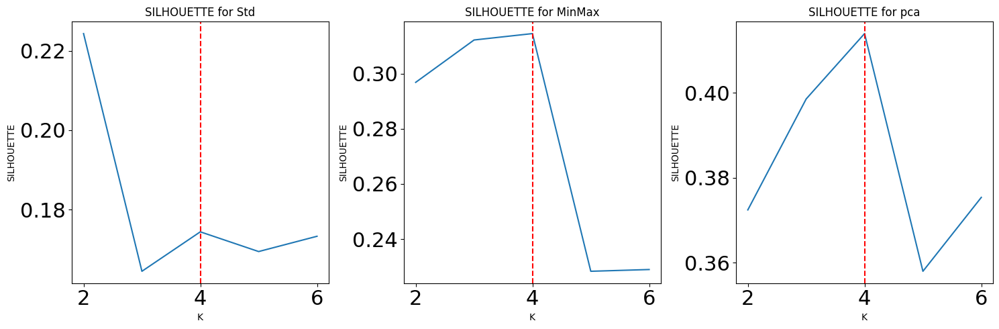

In [84]:
silhouette_list_std = []

for num_clusters in range(2, 7):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(X_std)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(X_std, cluster_labels)
    silhouette_list_std.append(silhouette_avg)

silhouette_list_minmax = []

for num_clusters in range(2, 7):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(X_minmax)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(X_minmax, cluster_labels)
    silhouette_list_minmax.append(silhouette_avg)

silhouette_list_pcs = []

for num_clusters in range(2, 7):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(pcs)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(pcs, cluster_labels)
    silhouette_list_pcs.append(silhouette_avg)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))


axes[0].plot(range(2, len(silhouette_list_std) + 2), silhouette_list_std)
axes[0].set_ylabel('SILHOUETTE')
axes[0].set_xlabel('K')
axes[0].tick_params(axis='both', which='major', labelsize=22)
axes[0].set_title("SILHOUETTE for Std")
axes[0].axvline(4, linestyle='--', color='r')

axes[1].plot(range(2, len(silhouette_list_minmax) + 2), silhouette_list_minmax)
axes[1].set_ylabel('SILHOUETTE')
axes[1].set_xlabel('K')
axes[1].tick_params(axis='both', which='major', labelsize=22)
axes[1].set_title("SILHOUETTE for MinMax")
axes[1].axvline(4, linestyle='--', color='r')

axes[2].plot(range(2, len(silhouette_list_pcs) + 2), silhouette_list_pcs)
axes[2].set_ylabel('SILHOUETTE')
axes[2].set_xlabel('K')
axes[2].tick_params(axis='both', which='major', labelsize=22)
axes[2].set_title('SILHOUETTE for pca')
axes[2].axvline(4, linestyle='--', color='r')

plt.tight_layout()
plt.show()

In this way we clearly see that the *lowest elbow point* is 4 for both minmax and PCA.  At this point we then run the K-Means again, but this time we create only 4 clusters.
We also from this point on drop the analysis for the **StandardScaler()** because we can see from both the explainability and the elbow method that it would need too many clusters to  give significant results. 

In [22]:
kmeans_minmax = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=42)
kmeans_minmax.fit(X_minmax)

kmeans_pca = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=42)
kmeans_pca.fit(pcs)

KMeans(max_iter=100, n_clusters=4, n_init=10, random_state=42)

But what does this method does underneath and what really means to calculate inertia is to calculate the **Within Cluster Sum of Squares (WCSS)**. It essentially describes how much variance we have inside a single cluster. The smaller the WCSS is, the closer our points are, therefore we have a more well-formed cluster. The WCSS formula can be used for any number of clusters:
$$
\text{WCSS} = \sum (\text{P}_{i_1} - \text{Centroid}_1)^2 + \dots + \sum (\text{P}_{i_n} - \text{Centroid}_n)^2
$$
The *labels_* attribute, on the other hand, will give a preview of the cluster labels assigned to the first 5 observations in the dataset after running the K-Means algorithm. These labels are integers that indicate to which cluster each of the first 5 observations belongs.

In [23]:
kmeans_minmax.labels_[:5]

array([3, 1, 2, 3, 1], dtype=int32)

The command **np.unique()** with the code *return_counts=True* utilizes the **NumPy** library to return the unique elements in the cluster labels generated by the K-means model, along with the count of how many times each unique value appears. This latter information, in particular, can be valuable for us to understand how the elements are distributed across the various clusters. The initial piece of information is provided by our decision to use 3 clusters.

In [24]:
np.unique(kmeans_minmax.labels_, return_counts=True)

(array([0, 1, 2, 3], dtype=int32), array([ 9461, 32954, 11565, 23561]))

Here, we further utilize the clusters created with the **histogram** method from NumPy, counting how many times each cluster label appears in the labels generated by the K-Means model. The argument *kmeans.labels_* provides the data, and the bins argument specifies the bin edges for which the elements are counted. The function returns two arrays: hist contains the counts, and bins contains the bin edges.

We then plot the histogram to gain a visual insight.

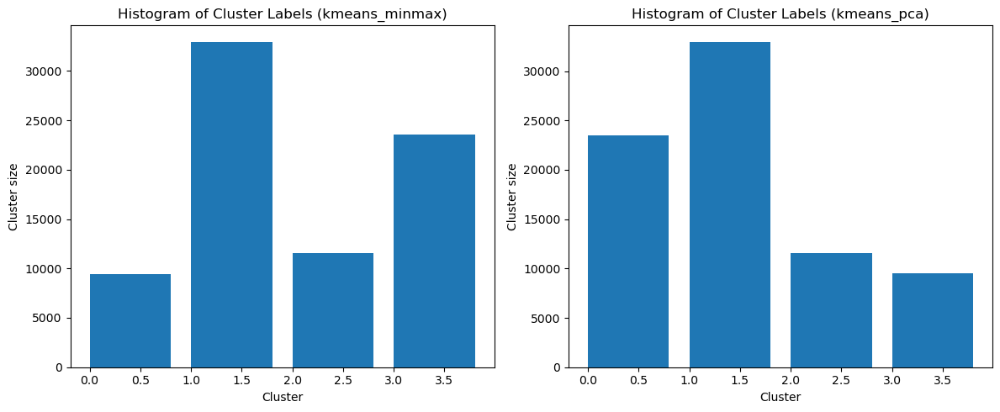

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Histogram for kmeans_minmax
hist_minmax, bins_minmax = np.histogram(kmeans_minmax.labels_, bins=range(0, len(set(kmeans_minmax.labels_)) + 1))
axes[0].bar(bins_minmax[:-1], hist_minmax, width=0.8, align='edge')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Cluster size')
axes[0].set_title('Histogram of Cluster Labels (kmeans_minmax)')

# Histogram for kmeans_pca
hist_pca, bins_pca = np.histogram(kmeans_pca.labels_, bins=range(0, len(set(kmeans_pca.labels_)) + 1))
axes[1].bar(bins_pca[:-1], hist_pca, width=0.8, align='edge')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Cluster size')
axes[1].set_title('Histogram of Cluster Labels (kmeans_pca)')

plt.tight_layout()
plt.show()

We now turn instead to display the cluster in two dimensions - it would be possible to work in more than two dimensions but too expensive. We then choose two columns to display, in this case *Average Household Size* and *totalvotes*.

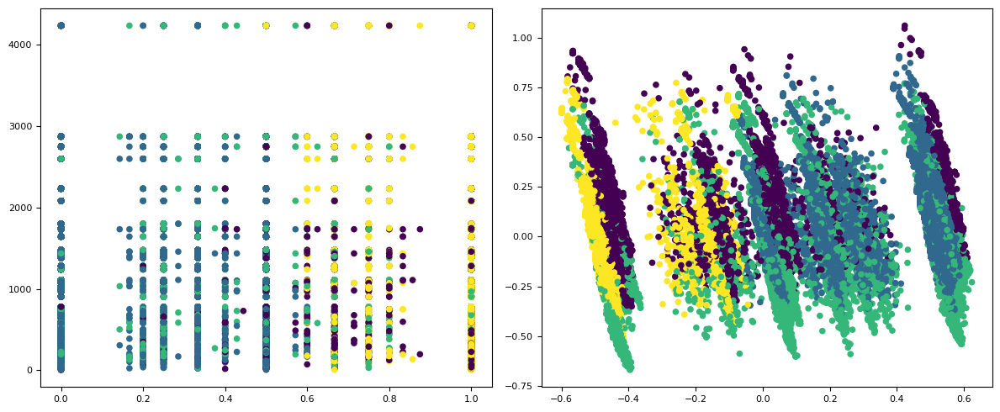

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatterplot for kmeans_minmax
axes[0].scatter(df['severity_index'], df['incidents_state_year'], 
                c=kmeans_minmax.labels_, s=20)
axes[0].tick_params(labelsize=8)

# Scatterplot for kmeans_pca
axes[1].scatter(pcs[:, 0], pcs[:, 3], 
                c=kmeans_minmax.labels_, s=20)
axes[1].tick_params(labelsize=8)

plt.tight_layout()
plt.show()

As we had already mentioned the problem of printing the results in two dimensions, when we are actually working in a space with a much larger number of dimensions - in this case eight - is that we cannot appreciate how the clusters are formed in the other components. Since printing a graph in many dimensions is impossible - there are techniques that do not make the graph clear anyway - we decide to print scatter plots between all pairs of components. To do this we again use the **pairplot()** command. As can be seen in some column pairs the clusters are visibly more separated than others, but this always depends on the fact that we are working in multiple dimensions.

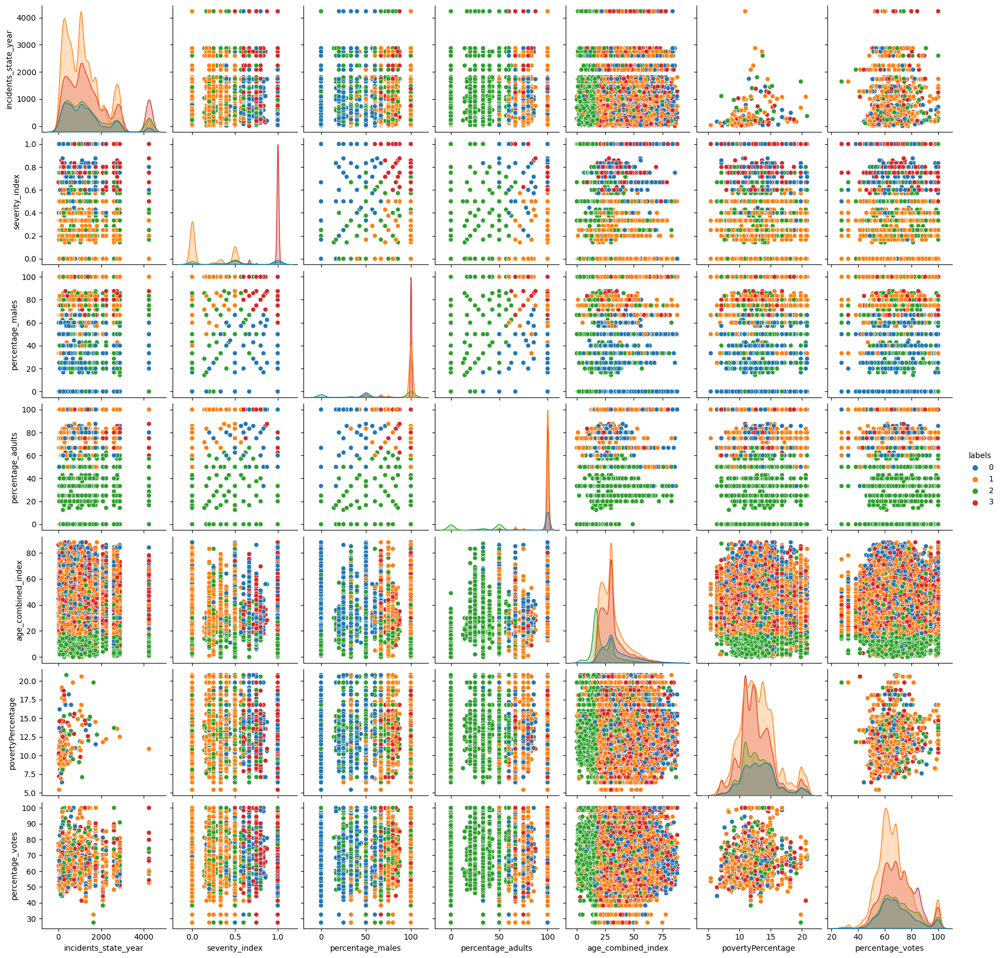

In [27]:
n_clusters = len(np.unique(kmeans_minmax.labels_))
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(kmeans_minmax.labels_, index=df.index)
sns.pairplot(df,hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

The **cluster_centers_** attribute returns the coordinates of the centroids of the clusters obtained by the K-means algorithm after training. Each row of this matrix represents the coordinates of a centroid associated with a specific cluster. The size of this matrix will be *(number_of_clusters, number_of_features)*.

In [28]:
kmeans_minmax.cluster_centers_

array([[0.28160703, 0.66804304, 0.3338216 , 0.95970316, 0.39481964,
        0.51104054, 0.56919815],
       [0.27795463, 0.16681724, 0.94039886, 0.97758072, 0.35102766,
        0.4887689 , 0.53749711],
       [0.34414667, 0.47022913, 0.7873695 , 0.27904461, 0.25616842,
        0.49102269, 0.58564517],
       [0.35824484, 0.98057297, 0.99182411, 0.9876126 , 0.34854531,
        0.46773945, 0.59135184]])

In [29]:
kmeans_pca.cluster_centers_

array([[-0.47119239, -0.14534227, -0.04777216, -0.01989229],
       [ 0.34988983, -0.14471673, -0.02768853,  0.00999859],
       [ 0.06486007,  0.55201534, -0.22345559, -0.10045019],
       [-0.12676637,  0.1899378 ,  0.48781503,  0.13728221]])

This code is used to create another 2-dimensional scatter plot, with the same attributes as before - *Average Household Size* and *totalvotes* - plotted on the x and y axes, respectively. The difference from the image before therefore is solely in the fact that in these cases we also print the centers of the clusters, using red stars to indicate them. 

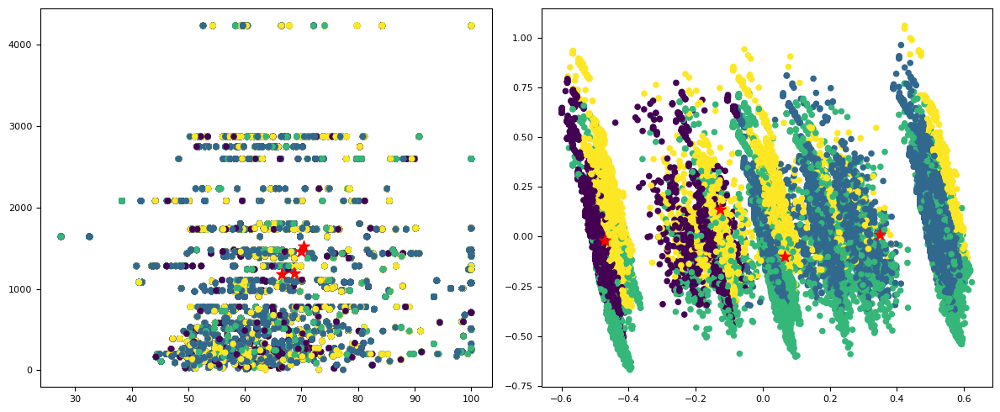

In [30]:
centers_minmax = scaler.inverse_transform(kmeans_minmax.cluster_centers_)
centers_pca = kmeans_pca.cluster_centers_

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatterplot for kmeans_minmax
axes[0].scatter(df['percentage_votes'], df['incidents_state_year'], c=kmeans_minmax.labels_, 
                s=20)
axes[0].scatter(centers_minmax[:, 6], centers_minmax[:, 0], s=100, marker='*', c='r')
axes[0].tick_params(axis='both', which='major', labelsize=8)

# Scatterplot for kmeans_pca
axes[1].scatter(pcs[:, 0], pcs[:, 3], c=kmeans_pca.labels_, 
                s=20)
axes[1].scatter(centers_pca[:, 0], centers_pca[:, 3], s=100, marker='*', c='r')
axes[1].tick_params(axis='both', which='major', labelsize=8)

plt.tight_layout()
plt.show()

The centers in our case are very near. So let's see how they have moved with the additions of the various attributes. For this purpose we here plot for each cluster a line representing its center along the x-axis describing the attrbutes, changing its value along the y-axis.

This type of visualization can be beneficial for understanding the distribution and relative positions of the centroids in the feature space, providing insights into how the algorithm has grouped the data. It's particularly useful for interpreting the results of clustering algorithms like K-means.

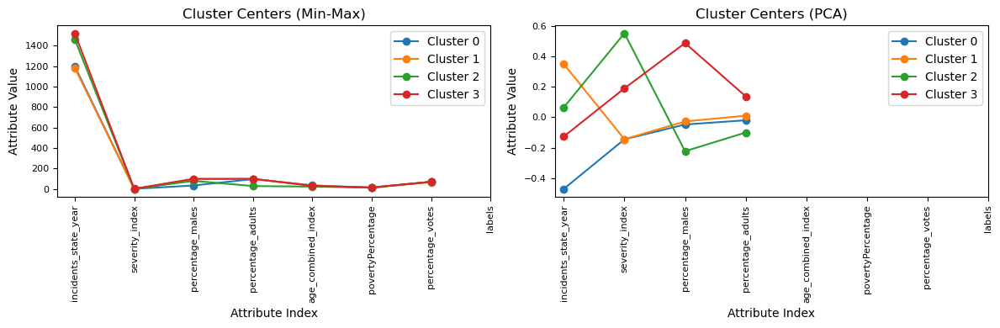

In [31]:
plt.figure(figsize=(12, 4))

# Plot for centers_minmax
plt.subplot(1, 2, 1)
for i in range(0, len(centers_minmax)):
    plt.plot(centers_minmax[i], marker='o', label='Cluster %s' % i)
plt.tick_params(axis='both', which='major', labelsize=8)
plt.legend(fontsize=10)
plt.title('Cluster Centers (Min-Max)')
plt.xlabel('Attribute Index')
plt.ylabel('Attribute Value')
plt.xticks(range(len(df.columns)), df.columns, rotation=90)  # Add x-axis labels

# Plot for centers_pca
plt.subplot(1, 2, 2)
for i in range(0, len(centers_pca)):
    plt.plot(centers_pca[i], marker='o', label='Cluster %s' % i)
plt.tick_params(axis='both', which='major', labelsize=8)
plt.legend(fontsize=10)
plt.title('Cluster Centers (PCA)')
plt.xlabel('Attribute Index')
plt.ylabel('Attribute Value')
plt.xticks(range(len(df.columns)), df.columns, rotation=90)  # Add x-axis labels

plt.tight_layout()
plt.show()

The above plot is good but it can only describe the value change of the clusters' centroids on a 2-dimensional space. To overcame this limit here we use a **radar chart** - or spider or star plot - to visualize the cluster centroids in a multi-dimensional space.

The code generates a radar chart for each cluster, providing a visual representation of how each cluster's centroid is positioned across different variables. Radar charts are effective for comparing multivariate data across categories, showcasing the relative strengths and weaknesses of each cluster along different dimensions. This visualization aids in understanding the distinctive characteristics of each cluster in a multi-dimensional feature space.

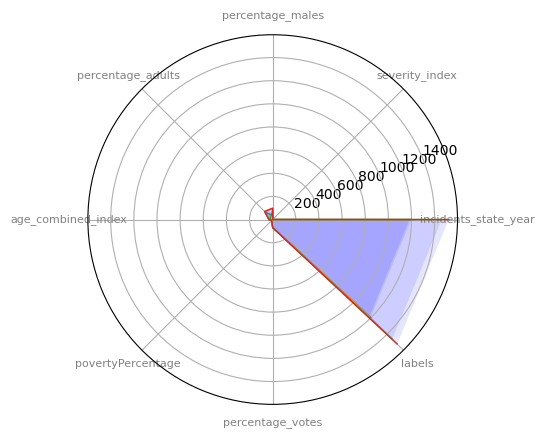

In [34]:
from math import pi
N = len(df.columns)
for i in range(0, len(centers_minmax)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers_minmax[i].tolist()
    values += values[:1]
    angles += angles[:1]
    ax = plt.subplot(polar=True)
    plt.xticks(angles[:-1], df.columns, color='grey', size=8) 
    ax.plot(angles[:-1], values, linewidth=1, linestyle='solid')
    ax.fill(angles[:-1], values, 'b', alpha=0.1)

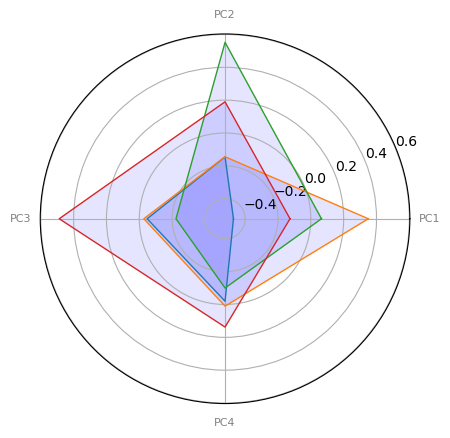

In [35]:
N = pcs.shape[1]
for i in range(len(centers_pca)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers_pca[i].tolist()
    values += values[:1]
    angles += angles[:1]
    ax = plt.subplot(polar=True)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([f'PC{i+1}' for i in range(N)], color='grey', size=8)
    ax.plot(angles, values, linewidth=1, linestyle='solid')
    ax.fill(angles, values, 'b', alpha=0.1)
plt.show()

Having finished analyzing visually our centroid we want to analyze the cluster as a whole and for this we calculate 2 statistics:
- *SSE (Sum of Squared Errors)*, also known as the inertia, for the K-Means model. It is a measure of how far each data point is from the center of its assigned cluster. A lower SSE indicates a better-defined clustering.
- *Separation (Davies-Bouldin Score)*, a metric for assessing the quality of a clustering. It measures the average similarity ratio of each cluster with its most similar cluster. A lower Davies-Bouldin Score implies better separation between clusters. A Davies-Bouldin Index close to 0 indicates well-separated and compact clusters.
- *Silhouette Score* that measures how well-separated clusters are and how similar each data point in a cluster is to the other points in the same cluster. Scores range from -1 to 1, where higher values indicate better-defined clusters.

In [36]:
from sklearn import metrics

print('SSE %s' % kmeans_minmax.inertia_)
print('Separation %s' % metrics.davies_bouldin_score(X_minmax, kmeans_minmax.labels_))
print('Silhouette %s' % silhouette_score(X_minmax, kmeans_minmax.labels_))

print('SSE %s' % kmeans_pca.inertia_)
print('Separation %s' % metrics.davies_bouldin_score(pcs, kmeans_pca.labels_))
print('Silhouette %s' % silhouette_score(pcs, kmeans_pca.labels_))

SSE 18263.975747454777
Separation 1.311865510442242
Silhouette 0.3145222848288245
SSE 12412.988261855648
Separation 1.0973809846463969
Silhouette 0.4139581466940232


### Add categorical attributes

Now that we are done clustering on our numerical attrbutes, let's try to add the categorical attributes and see how they do with the clusters already existing.

In [37]:
df_c = df.join(df2)
df_c.head()

,incidents_state_year,severity_index,percentage_males,percentage_adults,age_combined_index,povertyPercentage,percentage_votes,labels,state
0,1103,1.000000,100.0,100.0,65.000000,15.3,57.307720,3,Indiana
1,276,0.600000,100.0,100.0,25.500000,17.5,69.473233,1,Pennsylvania
2,585,0.000000,100.0,0.0,29.982022,9.9,62.148368,2,District of Columbia
3,1034,1.000000,100.0,100.0,65.000000,10.7,59.857619,3,Pennsylvania
4,1282,0.333333,100.0,100.0,28.750000,13.4,67.342516,1,North Carolina


To do this analysis we perform a **cross-tabulation** - or contingency table - operation using the pandas library. The **pd.crosstab()** function in pandas is used for creating a cross-tabulation table. It computes a simple cross-tabulation of two - or more - factors. In this case, it is used to examine the relationship between cluster labels  - *kmeans.labels_* - and the values in the *state* column of the DataFrame df_c.

In summary, the code is creating a cross-tabulation table that shows the distribution of states across different clusters. It helps analyze how the states are distributed or concentrated within each cluster, providing insights into potential geographic patterns or associations within the clustered data. The resulting DataFrame, called **state_xt_pct**, can be further examined or visualized to better understand the relationship between clustering results and the *state* variable in the dataframe.

In [38]:
state_xt_pct_minmax = pd.crosstab(kmeans_minmax.labels_, df_c['state'], normalize='columns')
state_xt_pct_minmax

state,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
row_0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.124932,0.127424,0.138340,0.127503,0.119722,0.114873,0.121504,0.121160,0.117002,0.130221,0.128999,0.125000,0.085470,0.115519,0.120972,0.109924,0.105348,0.126062,0.116410,0.129496,0.119467,0.124022,0.121050,0.123690,0.125822,0.113291,0.138095,0.136691,0.117021,0.117460,0.127159,0.118644,0.126671,0.126383,0.157303,0.116379,0.126402,0.120332,0.118024,0.145763,0.131267,0.158273,0.119163,0.126599,0.128743,0.116788,0.124341,0.113772,0.125000,0.105332,0.0875
1,0.424226,0.465374,0.401845,0.425711,0.415281,0.408706,0.412729,0.445392,0.402194,0.421488,0.423505,0.479167,0.517094,0.416376,0.435288,0.432061,0.453809,0.416431,0.427419,0.431655,0.431699,0.434078,0.423674,0.431866,0.437500,0.422756,0.442857,0.446043,0.437690,0.412698,0.410256,0.440678,0.425915,0.441628,0.348315,0.427586,0.407747,0.437068,0.429763,0.450847,0.414768,0.417266,0.440821,0.424242,0.356287,0.386861,0.424131,0.437981,0.403986,0.429129,0.4500
2,0.152634,0.138504,0.160738,0.153846,0.161579,0.151149,0.153327,0.156997,0.162706,0.141836,0.151599,0.104167,0.123932,0.154554,0.143159,0.152672,0.132901,0.152975,0.152525,0.154676,0.136126,0.147486,0.145688,0.165618,0.137336,0.158901,0.161905,0.151079,0.138298,0.120635,0.159079,0.129237,0.146426,0.144948,0.140449,0.150000,0.154944,0.149378,0.144644,0.145763,0.144485,0.115108,0.144122,0.143434,0.170659,0.138686,0.149104,0.140291,0.179348,0.148895,0.1375
3,0.298207,0.268698,0.299078,0.292940,0.303418,0.325272,0.312440,0.276451,0.318099,0.306455,0.295897,0.291667,0.273504,0.313551,0.300581,0.305344,0.307942,0.304533,0.303647,0.284173,0.312708,0.294413,0.309588,0.278826,0.299342,0.305051,0.257143,0.266187,0.306991,0.349206,0.303506,0.311441,0.300988,0.287040,0.353933,0.306034,0.310907,0.293223,0.307569,0.257627,0.309480,0.309353,0.295894,0.305724,0.344311,0.357664,0.302424,0.307956,0.291667,0.316645,0.3250


In [39]:
state_xt_pct_pca = pd.crosstab(kmeans_pca.labels_, df_c['state'], normalize='columns')
state_xt_pct_pca

state,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
row_0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.298207,0.268698,0.297760,0.292940,0.303052,0.322854,0.312440,0.276451,0.318099,0.306232,0.295202,0.291667,0.273504,0.313234,0.300053,0.305344,0.307942,0.304533,0.302945,0.284173,0.312232,0.293296,0.308516,0.278826,0.297697,0.305051,0.257143,0.266187,0.306991,0.346032,0.302459,0.311441,0.300988,0.286683,0.353933,0.306034,0.310907,0.293223,0.307569,0.257627,0.309480,0.309353,0.295491,0.305499,0.344311,0.357664,0.301897,0.307956,0.291667,0.315995,0.3250
1,0.423683,0.465374,0.401845,0.425711,0.415829,0.409915,0.413693,0.445392,0.402194,0.421934,0.423505,0.479167,0.517094,0.417010,0.434760,0.430534,0.453809,0.417847,0.428121,0.431655,0.432651,0.434637,0.423674,0.433962,0.439967,0.423247,0.442857,0.446043,0.439210,0.412698,0.410256,0.442797,0.425915,0.440557,0.348315,0.429023,0.407747,0.437068,0.429121,0.450847,0.414312,0.417266,0.440419,0.424242,0.359281,0.386861,0.425184,0.437981,0.403986,0.429779,0.4500
2,0.153178,0.138504,0.159420,0.153846,0.160483,0.152358,0.154291,0.156997,0.162706,0.141389,0.151947,0.104167,0.123932,0.154395,0.142631,0.152672,0.134522,0.152266,0.152525,0.154676,0.136126,0.148603,0.147295,0.163522,0.136513,0.158411,0.161905,0.151079,0.136778,0.123810,0.161172,0.129237,0.146426,0.145305,0.140449,0.147701,0.153925,0.149378,0.144965,0.145763,0.144485,0.115108,0.144525,0.142985,0.167665,0.138686,0.148051,0.140291,0.179348,0.148895,0.1375
3,0.124932,0.127424,0.140975,0.127503,0.120636,0.114873,0.119576,0.121160,0.117002,0.130444,0.129346,0.125000,0.085470,0.115360,0.122557,0.111450,0.103728,0.125354,0.116410,0.129496,0.118991,0.123464,0.120514,0.123690,0.125822,0.113291,0.138095,0.136691,0.117021,0.117460,0.126112,0.116525,0.126671,0.127454,0.157303,0.117241,0.127421,0.120332,0.118345,0.145763,0.131723,0.158273,0.119565,0.127273,0.128743,0.116788,0.124868,0.113772,0.125000,0.105332,0.0875


The bar plot visualizes the distribution of states within each cluster, providing a graphical representation of how different states are distributed across the identified clusters. Each bar corresponds to a cluster, and the height of the bar represents the frequency of each state within that cluster. The x-axis represents the clusters, and the y-axis represents the states. We do not print the legend telling us what color is associated with each state because this would take up the whole chart, and since there are many states it would not help us understand the chart better.

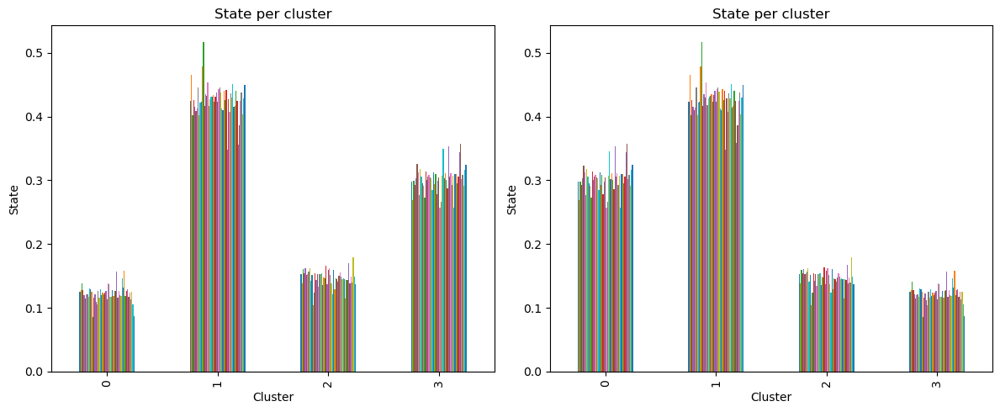

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot for state_xt_pct_minmax
state_xt_pct_minmax.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[0])
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('State')
axes[0].legend().set_visible(False)

# Plot for state_xt_pct_pca
state_xt_pct_pca.plot(kind='bar', stacked=False, title='State per cluster', ax=axes[1])
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('State')
axes[1].legend().set_visible(False)

plt.tight_layout()
plt.show()

## DBSCAN

In the realm of clustering algorithms, where the goal is to unearth hidden structures within datasets, DBSCAN emerges as a robust and flexible approach. DBSCAN, which stands for Density-Based Spatial Clustering of Applications with Noise, is a pioneering algorithm in the field of unsupervised learning. Unlike traditional methods that rely on assumptions about the shape or number of clusters, DBSCAN dynamically adapts to the inherent density patterns present in the data.

As we delve into this section, we will explore the fundamental principles behind DBSCAN and its distinctive ability to identify clusters of varying shapes and sizes. From understanding the core concepts of density-based clustering to witnessing how DBSCAN excels in unveiling intricate structures while gracefully handling noise, this segment will illuminate the power and versatility that DBSCAN brings to the broader landscape of clustering algorithms. Join us on a journey through the intricacies of DBSCAN as we unravel its significance in revealing meaningful patterns in diverse datasets.

Here we start importing the necessary library **DBSCAN** from *sklearn.cluster*.

In [41]:
from sklearn.cluster import DBSCAN

The DBSCAN method is quite heavy on calculations, for this reason we restric our dataset to only a small part for this analysis. We do that using the *sample()* method of the DataFrame class.

In [42]:
sampled_data = df.sample(frac=0.16, random_state=42)

pcs_df = pd.DataFrame(pcs)
sampled_data_pca = pcs_df.sample(frac=0.16, random_state=42)

Here we start by creating an instance of the DBSCAN class. Here's a brief explanation of the parameters:
- *eps (epsilon)*: This parameter defines the maximum distance between two data points for one to be considered in the neighborhood of the other. In other words, it sets the radius of the neighborhood around each point.
- *min_samples*: This parameter specifies the minimum number of data points required to form a dense region (core point). A core point is a data point that has at least min_samples data points, including itself, within its neighborhood.

These parameters are necessary because the DBSCAN algorithm classifies data points into three categories:
- *Core points*: Points that have at least min_samples data points within their neighborhood.
- *Border points*: Points that are within the neighborhood of a core point but do not have enough neighbors to be considered core themselves.
- *Noise points*: Points that are neither core points nor border points. These are often considered outliers.

DBSCAN clusters the data by connecting core points and their reachable neighbors, forming dense regions. Border points may be part of a cluster but are not as central as core points. Noise points are not associated with any cluster.

In [43]:
best_score = -1
best_eps = None
best_min_samples = None

best_score_pca = -1
best_eps_pca = None
best_min_samples_pca = None

eps_values = [0.15, 0.25, 0.35, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0]
min_samples_values = [3, 5, 7, 10, 15]

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(sampled_data)
        silhouette = silhouette_score(sampled_data, dbscan.labels_)
        if silhouette > best_score:
            best_score = silhouette
            best_eps = eps
            best_min_samples = min_samples

        if eps < 0.35:
            dbscan_pca = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan_pca.fit(sampled_data_pca)
            silhouette_pca = silhouette_score(sampled_data_pca, dbscan_pca.labels_)
            if silhouette_pca > best_score_pca:
                best_score_pca = silhouette_pca
                best_eps_pca = eps
                best_min_samples_pca = min_samples

best_eps, best_min_samples, best_score, best_eps_pca, best_min_samples_pca, best_score_pca

(15.0, 3, 0.2717350165512656, 0.15, 10, 0.180274809245415)

Despite experimenting with various values for epsilon and min_samples, the silhouette score for DBSCAN does not show significant improvement. Moreover, when applied to PCA-transformed data, the silhouette scores exhibit a counterintuitive trend, wherein the optimal values for epsilon and min_samples appear to be inversely proportional.
Consequently, we have proceeded to recompute the DBSCAN analyses using their respective maximum values.

In [44]:
dbscan = DBSCAN(eps=15, min_samples=3)
dbscan.fit(sampled_data)
dbscan_pca = DBSCAN(eps=0.15, min_samples=10)
dbscan_pca.fit(sampled_data_pca)

DBSCAN(eps=0.15, min_samples=10)

With the *labels_* command we re-print the clusters of the first 5 rows of the dataframe.

In [45]:
dbscan.labels_[:5]

array([0, 1, 2, 3, 4])

And again we use the *unique* command to count how many elements are in each cluster.

In [46]:
np.unique(dbscan.labels_, return_counts=True)

(array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
         12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
         25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
         38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
         51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
         64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
         77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
         90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
        116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
        129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
        142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
        155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        168, 169, 170, 171, 172, 173, 174, 175, 176

In this visual representation, the scatter plot provides a snapshot of our dataset along the x and y axes, representing *Average Household Size* and *population*. The colors signify clusters identified by the DBSCAN algorithm. Each point's color is determined by its cluster label, showcasing distinct groupings.

Clusters form based on data density and the algorithm's parameters. Core points, central to clusters, and border points, on the outskirts, create a nuanced depiction of our dataset. The point size, set to 20, enhances visibility without overshadowing cluster details.

This visual insight illustrates how DBSCAN efficiently discerns patterns within our data, aiding in the identification of natural groupings. Dive into the plot to decode the colors and understand the inherent structures highlighted by the clustering algorithm.

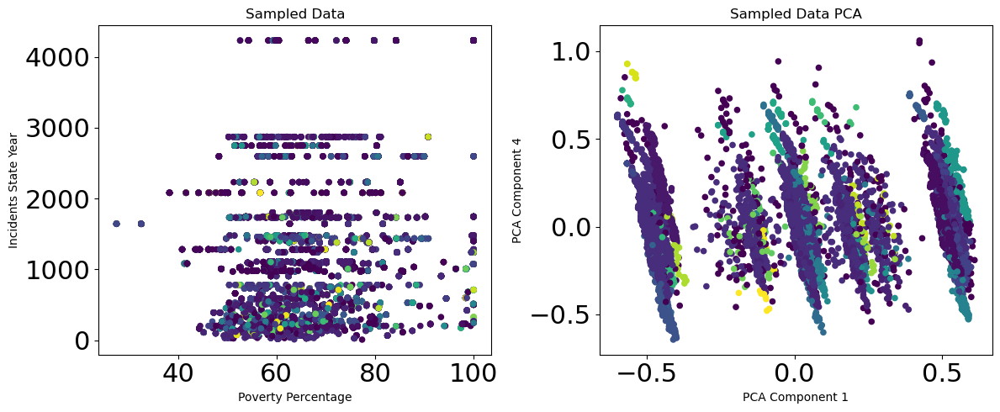

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot for sampled_data
axes[0].scatter(sampled_data['percentage_votes'], sampled_data['incidents_state_year'], c=dbscan.labels_, s=20)
axes[0].tick_params(axis='both', which='major', labelsize=22)
axes[0].set_title('Sampled Data')
axes[0].set_xlabel('Poverty Percentage')
axes[0].set_ylabel('Incidents State Year')

# Scatter plot for sampled_data_pca
axes[1].scatter(sampled_data_pca[0], sampled_data_pca[3], c=dbscan_pca.labels_, s=20)
axes[1].tick_params(axis='both', which='major', labelsize=22)
axes[1].set_title('Sampled Data PCA')
axes[1].set_xlabel('PCA Component 1')
axes[1].set_ylabel('PCA Component 4')

plt.tight_layout()
plt.show()

The **Silhouette Score** provides a measure of how well-defined our clusters are, ranging from -1 to 1. A high positive score indicates that data points within a cluster are close to each other, well-separated from other clusters. Conversely, a score near zero or negative suggests overlapping clusters or misclassifications.

By scrutinizing this single metric, we gain valuable insights into the cohesion and separation of our clusters, guiding us in the assessment of our clustering model. Join us as we interpret the Silhouette Score, unraveling the intricacies of our clustered data and gauging the efficacy of our clustering algorithm.

In [48]:
print('Silhouette %s' % silhouette_score(sampled_data, dbscan.labels_))
print('Silhouette %s' % silhouette_score(sampled_data_pca, dbscan_pca.labels_))

Silhouette 0.2717350165512656
Silhouette 0.180274809245415


We now use this code to compute the pairwise Euclidean distances between data points in a dataset and then transform the resulting one-dimensional distance array into a square distance matrix. Let's break it down:
- Here, pdist from the SciPy library is used to compute the pairwise Euclidean distances between all pairs of data points in the sampled_data dataset. The 'euclidean' parameter specifies that the Euclidean distance metric is used to calculate distances.\
The result, dist, is a one-dimensional array containing the pairwise distances between all unique pairs of points in sampled_data. The length of this array,  where n is the number of data points, is: $$ \frac{n \cdot (n - 1)}{2} $$
- After obtaining the one-dimensional distance array, the squareform function from SciPy is used to convert it into a square distance matrix. The square matrix is a symmetric matrix where each element dist[i,j] represents the distance between point i and point j in the dataset.\
The resulting dist matrix is more intuitive to work with, especially when dealing with algorithms or analyses that require a distance matrix, such as hierarchical clustering.

In [49]:
from scipy.spatial.distance import pdist, squareform

dist = pdist(sampled_data, 'euclidean') 
dist = squareform(dist)
dist_pca = pdist(sampled_data_pca, 'euclidean') 
dist_pca = squareform(dist_pca)

Next, the code calculates the distances to the kth nearest neighbor for each data point. In this case, k is set to 3. This information is useful in understanding the local density around each data point, a critical aspect in clustering and anomaly detection.

In [50]:
k = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[k]
    kth_distances.append(d[index_kth_distance])

kth_distances_pca = list()
for d_pca in dist_pca:
    index_kth_distance = np.argsort(d_pca)[k]
    kth_distances_pca.append(d[index_kth_distance])

Finally, the code generates a line plot visualizing the sorted distances to the kth nearest neighbor for each data point. This plot, with the x-axis representing data point indices and the y-axis representing sorted distances, offers insights into the distribution of distances and local density patterns. The plotted information is crucial for assessing the clustering quality and understanding how data points are grouped based on their proximity.

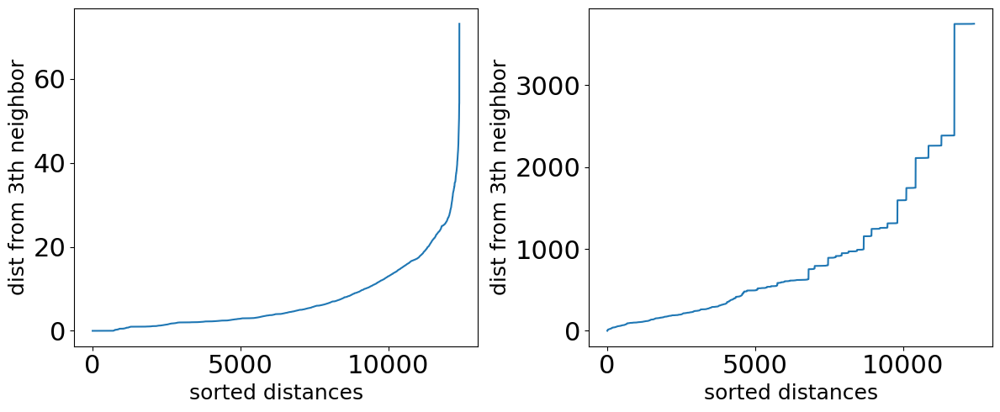

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot for kth_distances
axes[0].plot(range(0, len(kth_distances)), sorted(kth_distances))
axes[0].set_ylabel('dist from %sth neighbor' % k, fontsize=18)
axes[0].set_xlabel('sorted distances', fontsize=18)
axes[0].tick_params(axis='both', which='major', labelsize=22)

# Plot for kth_distances_pca
axes[1].plot(range(0, len(kth_distances_pca)), sorted(kth_distances_pca))
axes[1].set_ylabel('dist from %sth neighbor' % k, fontsize=18)
axes[1].set_xlabel('sorted distances', fontsize=18)
axes[1].tick_params(axis='both', which='major', labelsize=22)

plt.tight_layout()
plt.show()

## Hierarchical clustering

**Hierarchical clustering** represents an intriguing and flexible approach in the realm of unsupervised learning, designed to unveil intrinsic structures in data through a hierarchy of clusters. Unlike partitioning methods like K-Means, hierarchical clustering creates a tree-like structure that organizes observations in a nested fashion, allowing for a more detailed representation of similarity relationships among data points. 

This section will delve into the concept of hierarchical clustering, examining the two primary approaches: agglomerative and divisive hierarchical clustering. Distinctive advantages of this methodology will be outlined, alongside practical considerations for implementation using machine learning libraries such as scikit-learn. Through this in-depth analysis, we aim to provide a comprehensive overview of hierarchical clustering and its applications, highlighting its peculiarities and inherent challenges in the field of data analysis.

In [52]:
from scipy.stats import mode
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

These methods are computationally expensive so we take only subsets of our datasets in this section.

In [53]:
df_sampled = df.sample(frac=0.1, random_state=42)

pcs_sampled = pcs[np.random.choice(pcs.shape[0], size=int(pcs.shape[0] * 0.1), replace=False)]

We also define a function to analyze the various hierarchical clusters.

In [54]:
from scipy.cluster.hierarchy import fcluster

In [55]:
def get_silhouette_score(data_link_df, data_link_pcs, df_sampled, pcs_sampled):
    num_clusters_range = range(3, 8)

    best_silhouette_score_df = -1
    best_num_clusters_df = None
    best_silhouette_score_pcs = -1
    best_num_clusters_pcs = None

    # Iterate over the range of numbers of clusters
    for num_clusters in num_clusters_range:
        # Perform hierarchical clustering and obtain cluster labels
        cluster_labels_df = fcluster(data_link_df, num_clusters, criterion='maxclust')
        cluster_labels_pcs = fcluster(data_link_pcs, num_clusters, criterion='maxclust')
        
        # Calculate the silhouette score
        silhouette_score_df = silhouette_score(df_sampled, cluster_labels_df, metric='euclidean')
        silhouette_score_pcs = silhouette_score(pcs_sampled, cluster_labels_pcs, metric='euclidean')
        
        # Update the best silhouette score and corresponding number of clusters if necessary
        if silhouette_score_df > best_silhouette_score_df:
            best_silhouette_score_df = silhouette_score_df
            best_num_clusters_df = num_clusters
        
        if silhouette_score_pcs > best_silhouette_score_pcs:
            best_silhouette_score_pcs = silhouette_score_pcs
            best_num_clusters_pcs = num_clusters

    # Print the best silhouette scores and corresponding number of clusters
    print(f'Best Silhouette Score for the original data: {best_silhouette_score_df} (Number of clusters: {best_num_clusters_df})')
    print(f'Best Silhouette Score for the PCA data: {best_silhouette_score_pcs} (Number of clusters: {best_num_clusters_pcs})')

Here we start to perform our hierarchical clustering analysis and we visualize the results through a dendrogram. In particular this code:
- Calculates *Pairwise Distances*, in this case using the Euclidean distance metric, to provide a measure of dissimilarity between every pair of data points. This matrix is a crucial input for the hierarchical clustering algorithm.
- Performs the actual *Hierarchical Clustering*, organizing data points into a tree-like structure based on their similarities. The linkage function is used to compute the linkage matrix, which represents the hierarchical relationships between clusters. The choice of linkage method - e.g., complete-linkage - and distance metric - e.g., Euclidean - affects how clusters are formed.
- Creates a *Dendrogram*, that is a tree diagram that illustrates the arrangement of clusters produced by hierarchical clustering. It visually represents the merging of clusters and the distances at which these mergers occur. The dendrogram function generates this visual representation, aiding in the interpretation of the clustering structure.
- Adds a *Red Horizontal Line*, added with plt.axhline that serves as a visual aid for determining the number of clusters or subclusters. It represents a threshold or cut-off point in the dendrogram. By setting a color threshold in the dendrogram - color_threshold=0.2 - clusters above a certain height are colored differently. The red line at a specified height - e.g., y=0.2 - can help in deciding how many clusters to consider, as clusters above this line are separated.

Here we use *Complete Linkage* also referred to as **Furthest Neighbor (FN)**, Farthest Point Algorithm, or VoorHees Algorithm. The distance between clusters is defined by the distance between their furthest members. This method is computationally expensive.

![ALT_TEXT_FOR_SCREEN_READERS1](../images/complete-linkage.webp)

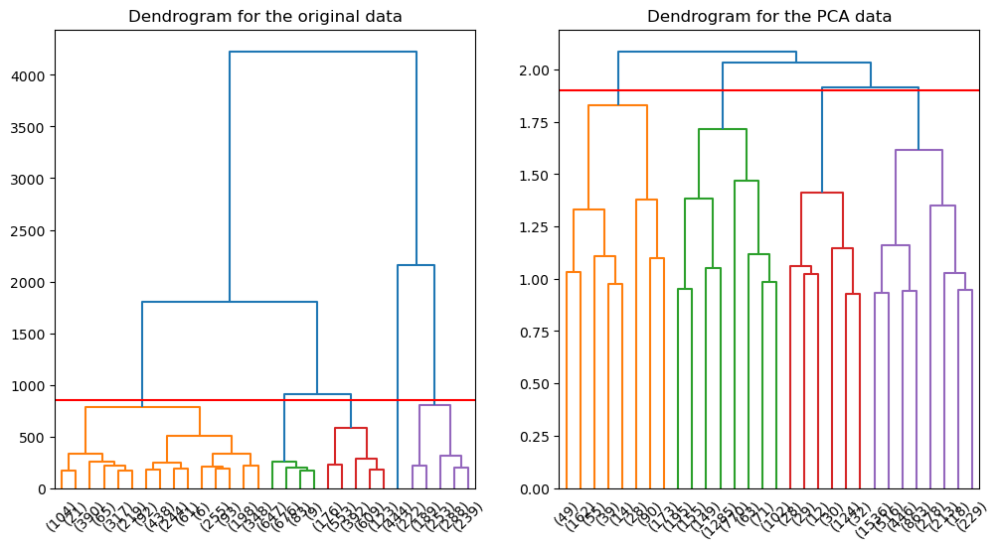

In [56]:
threshold = 850
threshold_pca = 1.90

# Dendrogram for df
data_dist_df = pdist(df_sampled, metric='euclidean')
data_link_df = linkage(data_dist_df, method='complete', metric='euclidean')

# Dendrogram for pcs_sampled
data_dist_pcs = pdist(pcs_sampled, metric='euclidean')
data_link_pcs = linkage(data_dist_pcs, method='complete', metric='euclidean')

# Plotting side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Dendrogram for df
res_df = dendrogram(data_link_df, color_threshold=threshold, truncate_mode='lastp', ax=axes[0])
axes[0].axhline(y=threshold, color='r', linestyle='-')
axes[0].set_title('Dendrogram for the original data')

# Dendrogram for pcs_sampled
res_pcs = dendrogram(data_link_pcs, color_threshold=threshold_pca, truncate_mode='lastp', ax=axes[1])
axes[1].axhline(y=threshold_pca, color='r', linestyle='-')
axes[1].set_title('Dendrogram for the PCA data')

plt.show()

In [57]:
get_silhouette_score(data_link_df, data_link_pcs, df_sampled, pcs_sampled)

Best Silhouette Score for the original data: 0.6555376816294434 (Number of clusters: 4)
Best Silhouette Score for the PCA data: 0.26806104564499506 (Number of clusters: 7)


We now try to evaluate the quality of these clusters, calculating the silhouette scores for each of them, to at the end find the best method of hierarchical clustering applied to our data.

Here we modify the previous commands by using the *single linkage* also referred to as **Nearest Neighbor (NN)**. The distance between clusters is defined by the distance between their closest members.

![ALT_TEXT_FOR_SCREEN_READERS2](../images/single-linkage.webp)

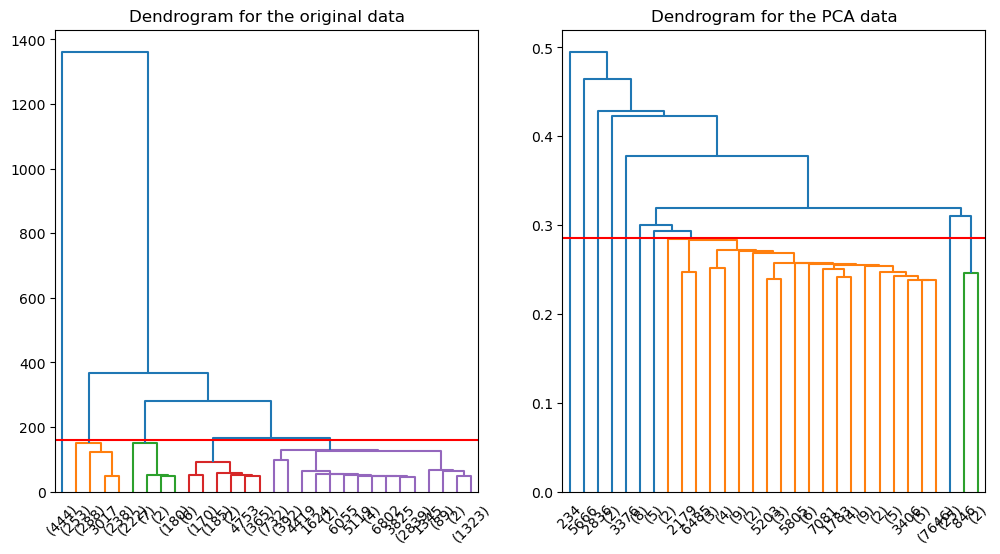

In [58]:
threshold = 160
threshold_pca = 0.285

# Dendrogram for df
data_dist_df = pdist(df_sampled, metric='euclidean')
data_link_df = linkage(data_dist_df, method='single', metric='euclidean')

# Dendrogram for pcs_sampled
data_dist_pcs = pdist(pcs_sampled, metric='euclidean')
data_link_pcs = linkage(data_dist_pcs, method='single', metric='euclidean')

# Plotting side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Dendrogram for df
res_df = dendrogram(data_link_df, color_threshold=threshold, truncate_mode='lastp', ax=axes[0])
axes[0].axhline(y=threshold, color='r', linestyle='-')
axes[0].set_title('Dendrogram for the original data')

# Dendrogram for pcs_sampled
res_pcs = dendrogram(data_link_pcs, color_threshold=threshold_pca, truncate_mode='lastp', ax=axes[1])
axes[1].axhline(y=threshold_pca, color='r', linestyle='-')
axes[1].set_title('Dendrogram for the PCA data')

plt.show()

In [59]:
get_silhouette_score(data_link_df, data_link_pcs, df_sampled, pcs_sampled)

Best Silhouette Score for the original data: 0.6065490522184209 (Number of clusters: 3)
Best Silhouette Score for the PCA data: 0.3393177788558237 (Number of clusters: 3)


And here we use the *average linkage* also known as **UPGMA** - Unweighted Pair Group Method with Arithmetic mean. The percentage of the number of points of each cluster is calculated with respect to the number of points of the two clusters if they were merged.

![ALT_TEXT_FOR_SCREEN_READERS3](../images/average-linkage.webp)

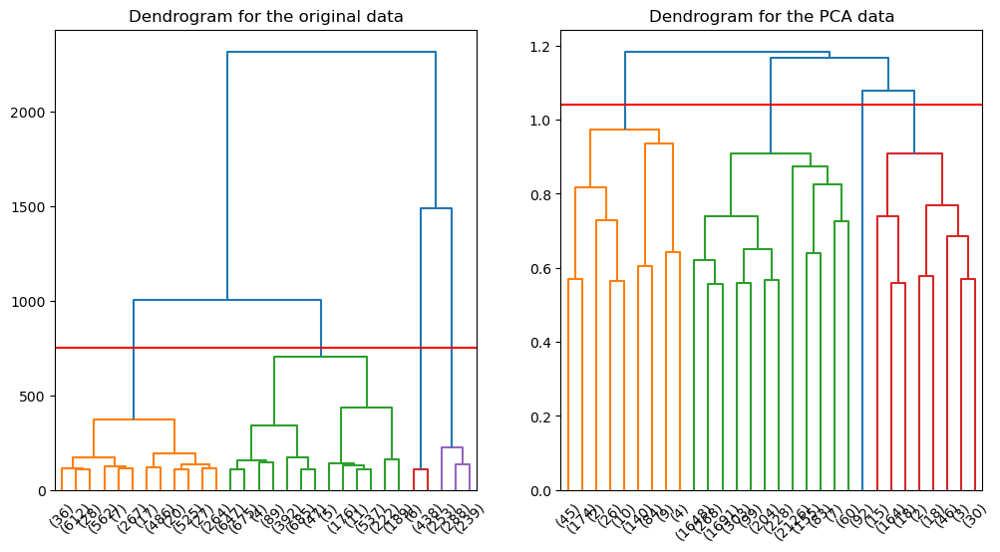

In [60]:
threshold = 750
threshold_pca = 1.04

# Dendrogram for df
data_dist_df = pdist(df_sampled, metric='euclidean')
data_link_df = linkage(data_dist_df, method='average', metric='euclidean')

# Dendrogram for pcs_sampled
data_dist_pcs = pdist(pcs_sampled, metric='euclidean')
data_link_pcs = linkage(data_dist_pcs, method='average', metric='euclidean')

# Plotting side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Dendrogram for df
res_df = dendrogram(data_link_df, color_threshold=threshold, truncate_mode='lastp', ax=axes[0])
axes[0].axhline(y=threshold, color='r', linestyle='-')
axes[0].set_title('Dendrogram for the original data')

# Dendrogram for pcs_sampled
res_pcs = dendrogram(data_link_pcs, color_threshold=threshold_pca, truncate_mode='lastp', ax=axes[1])
axes[1].axhline(y=threshold_pca, color='r', linestyle='-')
axes[1].set_title('Dendrogram for the PCA data')

plt.show()

In [61]:
get_silhouette_score(data_link_df, data_link_pcs, df_sampled, pcs_sampled)

Best Silhouette Score for the original data: 0.6514078263463129 (Number of clusters: 5)
Best Silhouette Score for the PCA data: 0.3484021059087086 (Number of clusters: 3)


The **AgglomerativeClustering** class is part of scikit-learn's clustering module and is designed to perform hierarchical agglomerative clustering on input data. This class provides a flexible and customizable implementation of the agglomerative clustering algorithm. The key parameters are:
- *n_clusters*: Specifies the number of clusters to form.
- *affinity*: Determines the distance metric used for linkage calculation. Can be set to "euclidean," "l1," "l2," "manhattan," "cosine," or other valid distance metrics. The default is "euclidean".
- *linkage*: Determines the linkage criterion to use for cluster merging. Common choices include "ward," "complete," "average," and "single". The default is "ward".
- *distance_threshold*: If not None, clusters are formed as flat clusters cut from the hierarchical tree at the specified distance. The default is None.

We then use the *fit_predict* method to fit the model and return cluster labels for each data point. Finally we plot the results in 2 dimensions.

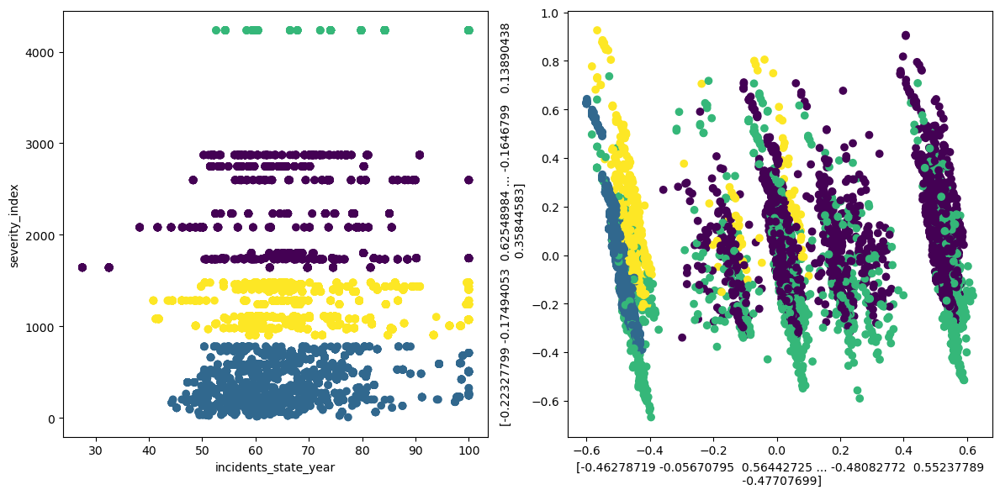

In [62]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
cluster.fit_predict(df_sampled)

cluster_pca = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
cluster_pca.fit_predict(pcs_sampled)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(df_sampled['percentage_votes'], df_sampled['incidents_state_year'], c=cluster.labels_)
axes[0].set_xlabel(df.columns[0])
axes[0].set_ylabel(df.columns[1])

# Plot using pcs
axes[1].scatter(pcs_sampled[:,0], pcs_sampled[:,3], c=cluster_pca.labels_)
axes[1].set_xlabel(pcs[:,0])
axes[1].set_ylabel(pcs[:,1])

plt.tight_layout()
plt.show()

In [63]:
def find_best_clusters(data, max_clusters=10):
    silhouette_scores = []
    for n_clusters in range(2, max_clusters + 1):
        cluster = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
        labels = cluster.fit_predict(data)
        
        silhouette_avg = silhouette_score(data, labels)
        silhouette_scores.append(silhouette_avg)
        
    best_n_clusters = np.argmax(silhouette_scores) + 2
    best_silhouette_score = max(silhouette_scores)
    return best_n_clusters, best_silhouette_score

In [64]:
best_clusters_df, best_score_df = find_best_clusters(df_sampled)

best_clusters_pcs, best_score_pcs = find_best_clusters(pcs_sampled)

print("Best number of cluster for df_sampled:", best_clusters_df, "with silhouette score:", best_score_df)
print("Best number of cluster for pcs_sampled:", best_clusters_pcs, "with silhouette score:", best_score_pcs)

Best number of cluster for df_sampled: 8 with silhouette score: 0.6656516414955874
Best number of cluster for pcs_sampled: 10 with silhouette score: 0.41095972036588546


## X-Means

Among the diverse family of clustering techniques, **X-Means** stands out as a dynamic and adaptive approach that addresses the challenge of determining the optimal number of clusters in a dataset.

Originally introduced as an extension of the classic K-Means algorithm, X-Means incorporates a sophisticated mechanism for automatically determining the appropriate number of clusters, offering a data-driven alternative to the manual specification of cluster counts. This adaptive nature becomes particularly advantageous in scenarios where the inherent structure of the data is not readily apparent, or when dealing with datasets of varying complexities.

This section delves into the intricacies of the X-Means algorithm, examining its underlying principles, scalability, and its ability to adapt to diverse datasets. We explore the distinctive features that set X-Means apart from traditional clustering methods and how it leverages the **Bayesian Information Criterion (BIC)** to guide the model in dynamically adjusting the number of clusters during the clustering process. Additionally, we investigate the implications of X-Means in terms of cluster quality and its performance across datasets with varying sizes and dimensionalities.

As we navigate through the X-Means algorithm, we aim to provide insights into its strengths, limitations, and real-world applications. By understanding the nuances of X-Means, researchers and practitioners can harness its capabilities to gain deeper insights into their data and enhance the efficiency of clustering tasks in diverse domains. 

We start the study of the dataframe with X-Means by import the libraries.

In [65]:
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.cluster.xmeans import xmeans, kmeans_plusplus_initializer
import warnings

The code begins by initializing a set number of initial cluster centers using the K-Means++ initialization method. It then proceeds to execute the X-Means algorithm across a range of potential cluster counts, specifically from 20 to 100 in increments of 10. For each iteration, an instance of the X-Means algorithm is created, employing the Bayesian Information Criterion (BIC) as a criterion for splitting clusters.

During the execution of X-Means, the algorithm dynamically determines the optimal number of clusters for the given dataset. After clustering, the code outputs the number of identified clusters, the sizes of each cluster, and the **Total Sum of Squared Errors (SSE)** – a measure of how well the data points within clusters are grouped.

This process is repeated for different cluster counts, providing insights into how the algorithm adapts to different complexities within the data. The printed information allows for an assessment of the algorithm's performance in terms of both cluster identification and the compactness of the resulting clusters, as indicated by the SSE.

In [66]:
# Create initial centers for xmeans algorithm
amount_initial_centers = 2
initial_centers = kmeans_plusplus_initializer(X_minmax, amount_initial_centers, random_state=42).initialize()

for maximum_clusters in np.arange(start=2, stop=20):
    xmeans_instance = xmeans(X_minmax, initial_centers, maximum_clusters, tolerance=0.5, random_state=47)
    xmeans_instance.process()

    print('Number of clusters: ', len(xmeans_instance.get_clusters()))
    cluster_sizes_list = [len(cluster) for cluster in xmeans_instance.get_clusters()]
    print('XMeans cluster sizes:', cluster_sizes_list)
    print("Total SSE:", xmeans_instance.get_total_wce())
    # calculate silhouette score
    # NOTE
    # We comment this part as it is too computationally expensive
    # flattened_labels = [label for cluster_index, cluster in enumerate(xmeans_instance.get_clusters()) for label in [cluster_index] * len(cluster)]
    # silhouette = silhouette_score(X_minmax, flattened_labels)
    # print("Silhouette Score:", silhouette)
    print()

Number of clusters:  2
XMeans cluster sizes: [65354, 12187]
Total SSE: 30773.482130371358

Number of clusters:  3
XMeans cluster sizes: [58239, 6257, 13045]
Total SSE: 27661.4083885583

Number of clusters:  4
XMeans cluster sizes: [54430, 5302, 5221, 12588]
Total SSE: 25560.407761480372

Number of clusters:  5
XMeans cluster sizes: [34050, 7069, 12814, 19993, 3615]
Total SSE: 19679.958213412207

Number of clusters:  6
XMeans cluster sizes: [31755, 19999, 7857, 4886, 9410, 3634]
Total SSE: 16158.635972731816

Number of clusters:  7
XMeans cluster sizes: [31423, 19454, 6332, 2219, 5224, 9259, 3630]
Total SSE: 15614.490817327884

Number of clusters:  8
XMeans cluster sizes: [29731, 16745, 5380, 6548, 2275, 4814, 8409, 3639]
Total SSE: 14642.607564458627

Number of clusters:  9
XMeans cluster sizes: [29996, 15609, 6231, 6289, 2300, 986, 4394, 8295, 3441]
Total SSE: 14418.88553021181

Number of clusters:  10
XMeans cluster sizes: [29994, 15378, 6214, 6148, 2222, 965, 3923, 1057, 8196, 3444]

## Conclusions
In general, we observed that the dataset normalized with MinMaxScaler outperforms the one normalized with PCA (which, on the other hand, assists in achieving similar results using fewer features) across all clustering algorithms, except for KMeans, where PCA performs better. The dataset normalized with StandardScaler yields the least favorable results.

The most promising clustering outcomes were achieved with hierarchical clustering, particularly employing the ward linkage method. PCA also exhibits good performance, notably in KMeans. Unfortunately, we couldn't thoroughly explore X-Means, which showed potential for enhancing our results.

# Latitude and PovertyPercentage

One of the correlations that immediately attracted our attention is the one inherent in *latitude* related to *povertyPercentage*. So now we want to do an analysis on these types of data. 

First then we create a sub-dataframe that has within it the columns that we are interested in carrying out this analysis. To do this we then take the *state* and *povertyPercentage* columns from the poverty table, and from the incidents table we take the *state* column to which we associate as latitude the median of all latitudes associated with that state. At this point we merge the two tables along the *state* column using the **.merge()** command.

In [67]:
path_to_original = '/datasets_original' 

poverty = pd.read_csv(f'{path_to_datasets}{path_to_original}/povertyByStateYear.csv') 

#select the desired columns
selected_columns = ['state', 'povertyPercentage']

#create a new dataframe with the selected columns
poverty_information = poverty[selected_columns]

latitude_information = join_dataframe.groupby('state').agg({
    'latitude': 'median'  #compute the median of "latitude"
}).reset_index()

lat_pov_df=poverty_information.merge(latitude_information, on="state", how="inner")
lat_pov_df.head()


,state,povertyPercentage,latitude
0,Alabama,14.8,33.4049
1,Alabama,14.5,33.4049
2,Alabama,14.6,33.4049
3,Alabama,14.7,33.4049
4,Alabama,16.0,33.4049


We understand how many and which data are null in this dataset.

In [68]:
print(lat_pov_df.isnull().sum())

lat_pov_df.dropna(subset=['povertyPercentage'], inplace=True)

state                 0
povertyPercentage    51
latitude              0
dtype: int64


At this point we move on to clustering on latitudes to create a number of meaningful clusters into which to divide the united states to study how poverty varies with latitude. To do this we use the **k-Means** method found in the **sklearn.cluster** library. 

In order to use this method first it would be useful to try to figure out what the optimal number of clusters is. We do this using the  **Elbow Method**. In general, we will want to create a number of clusters that give us an indicative idea of how poverty varies by latitude. One cluster is certainly not indicative, while 2 might already make sense if we think about the simple north-south division. Similarly, 20 clusters is certainly a lot. So let's vary the number of clusters in the Elbow Method between 2 and 10 and see which is best.

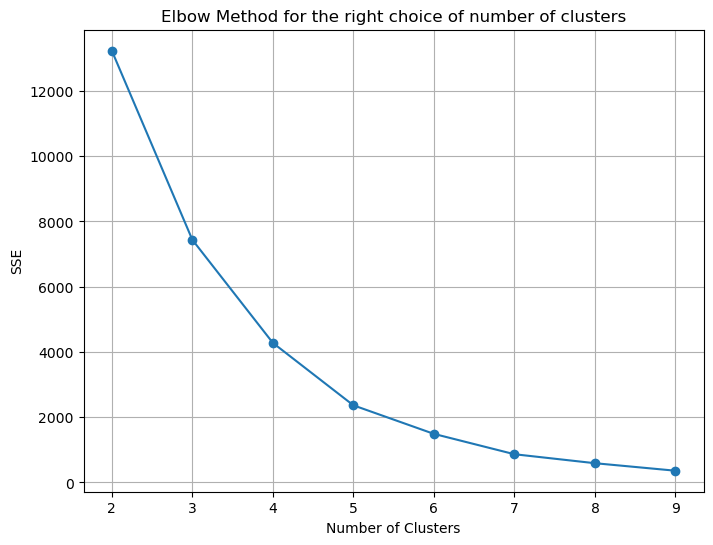

In [69]:
from sklearn.cluster import KMeans

num_clusters = list(range(2, 10))

# Compute inertia for each cluster
inertia = []
for n_clusters in num_clusters:
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    kmeans.fit(lat_pov_df[['latitude']])
    inertia.append(kmeans.inertia_)

# Plot the inertia's values for each cluster
plt.figure(figsize=(8, 6))
plt.plot(num_clusters, inertia, marker='o')
plt.title('Elbow Method for the right choice of number of clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.grid()
plt.show()

From the graph printed above we see that 5 or 6 are the ideal numbers of clusters if the Elbow Method is followed. At this point we then use the k-Means method where k=6 - after trying both of them we felt it was the best. Once this is done we add a new column in the dataframe, where each row is associated with the cluster to which this row belongs. Finally we print this new dataframe.

In [70]:
#ignore the warnings of "SettingWithCopyWarning"
pd.options.mode.chained_assignment = None  

n_clusters = 6

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
lat_pov_df['cluster'] = kmeans.fit_predict(lat_pov_df[['latitude']])

lat_pov_df.head()

,state,povertyPercentage,latitude,cluster
0,Alabama,14.8,33.4049,1
1,Alabama,14.5,33.4049,1
2,Alabama,14.6,33.4049,1
3,Alabama,14.7,33.4049,1
4,Alabama,16.0,33.4049,1


From that dataframe we create a new one that combines all the data that belong to the same cluster and has the following columns:
- *cluster*: the number indicating the cluster
- *state*: a set that contains all the states that occur in the cluster
- *povertyPercentage*: the mean calculated over all the *povertyPercentage* data that in the old table belonged to the cluster
- *latitude*: the median computed over all the *latitude* data that in the old table belonged to the cluster

In [71]:
result = lat_pov_df.groupby('cluster').agg({
    'state': set,  #converts occurrences of "state" to a set
    'povertyPercentage': 'mean',  #compute the mean of "povertyPercentage"
    'latitude': 'median'  #compute the median of "latitude"
}).reset_index()

#Name and sort the columns of result dataframe
result.columns = ['cluster', 'state', 'povertyPercentage', 'latitude']
result = result.sort_values(by='latitude')

display(result)

,cluster,state,povertyPercentage,latitude
3,3,{Hawaii},10.312500,20.902950
5,5,"{Texas, Mississippi, Louisiana, Florida}",16.937500,30.043075
1,1,"{Georgia, Alabama, New Mexico, Arizona, Califo...",14.680729,35.315050
4,4,"{Pennsylvania, Massachusetts, District of Colu...",11.800937,40.370500
0,0,"{Maine, Minnesota, North Dakota, Idaho, South ...",10.594712,44.199150
2,2,{Alaska},10.850000,61.227800


 At this point we rename the clusters to give an idea of what they indicate. We first see how the first and last clusters both refer to unic federal states: Hawaii and Alaska respectively - as you can see below their latitude is respectively much lower or much higher than the rest of the states. We therefore decide to rename the first cluster with the specific term "*Hawaii*" and the last cluster with the specific term "*Alaska*".  Actually, this choice also has another reason, which we will explain more in a moment.  The remaining clusters in the table will group the rest of the U.S. federal states. We will therefore name the one with the lowest latitude among the rest with "*South*," since it indicates the data referring to the southern US. Similarly we will do the same with the other clusters, going up as we go up to "*North*".

In [72]:
#rename the columns of result dataframe
new_cluster_name=['Hawaii', 'South', 'South-central', 'North-central', 'North', 'Alaska']
result['cluster'] = new_cluster_name

result.reset_index(drop=True, inplace=True)
result


,cluster,state,povertyPercentage,latitude
0,Hawaii,{Hawaii},10.312500,20.902950
1,South,"{Texas, Mississippi, Louisiana, Florida}",16.937500,30.043075
2,South-central,"{Georgia, Alabama, New Mexico, Arizona, Califo...",14.680729,35.315050
3,North-central,"{Pennsylvania, Massachusetts, District of Colu...",11.800937,40.370500
4,North,"{Maine, Minnesota, North Dakota, Idaho, South ...",10.594712,44.199150
5,Alaska,{Alaska},10.850000,61.227800


Finally, we move on to print two bar graphs that make us understand how the trend of *povertyPercentage* varies in relation to *latitude*. In detail:

  - Graph (a) (left) has on the x-axis the data referring to latitude, on the y-axis those referring to the poverty percentage. The bars refer to each cluster. 
  
  - Graph (b) (right) has on the x-axis the data referring to latitude, on the y-axis simply the clusters spaced consistently apart. The reason for printing this second graph is aesthetic: in fact, it is redundant with the first one, but more pleasing to the eye, and it is also easier to understand for those not concerned with the dataset, having the cluster names printed on the x-axis.

Both graphs show us the same thing: the percentage of poverty decreases from south to north, so on average southern states are poorer than southern states. What we are saying is that there is an opposite correlation: as latitude increases, the percentage of poverty goes down.

This trend is broken only by two clusters: the one referring to Hawaii and the one referring to Alaska - the first and last clusters. In fact, the cluster referring to Hawaii, despite having a lower latitude than the others, has the lowest percentage of poverty of all. In contrast, the Alaska cluster despite having a much higher latitude than all the other clusters, not only has not a much lower percentage of poverty, but also slightly higher than the "*North*" cluster.

To better understand this situation we believe it may be helpful to look at the first Graph (a). Indeed, we can see that the *Hawaii* and *Alaska* clusters are both at a latitude far removed from the other clusters. This may then explain why these clusters, which represent only 2 states out of the remaining 49 represented by other clusters, reverse the trend of the rest: they are simply too far apart to behave the same way. Let us explain it even further, so that we can also justify the choice of name for these clusters.  In the case of the last cluster, that of *Alaska*, we saw that despite being considered a federal state of the United States, it behaves differently. In fact, between Alaska and the rest of the United States is Canada, and there are thousands of miles of distance: we would not be surprised if Alaska behaved more like the Canadian states than the American states. Similarly between the Hawaai, and thus the first cluster, and the rest there are thousands of kilometers of sea. 

In practice, the *Hawaii* and *Alaska* clusters behave as if they were outliers. It is no accident that the two are the only clusters with a single state within them, and it is no accident that these two states are also separated geographically - and in latitude - from the remaining U.S. states. Finally, it is nice to note that even as customs and traditions in fact these states are profoundly different from the rest of the states. 

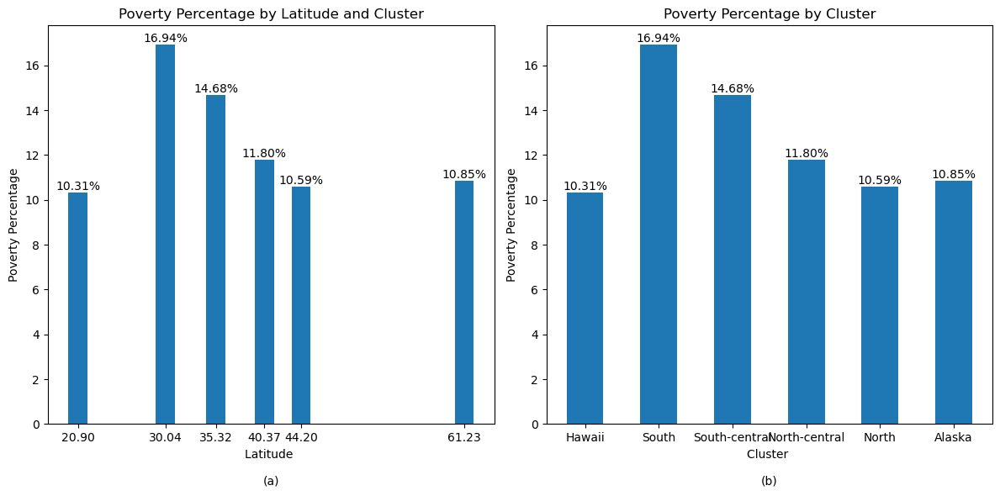

In [73]:
plt.figure(figsize=(12, 6))

#first subplot on the left
plt.subplot(1, 2, 1)
plt.bar(result['latitude'], result['povertyPercentage'], width=2)
plt.xlabel('Latitude \n\n(a)')
plt.ylabel('Poverty Percentage')
plt.title('Poverty Percentage by Latitude and Cluster')

#add values of povertyPercentage on the bars
for x, y in zip(result['latitude'], result['povertyPercentage']):
    plt.text(x, y, f'{y:.2f}%', ha='center', va='bottom')

plt.xticks(result['latitude'])

#second subplot on the right
plt.subplot(1, 2, 2)

#create a list of cluster labels
labels_cluster = [f'{cluster}' for cluster in result['cluster']]

#width and positions of bars
width_bars = 0.5
position_bars = range(len(labels_cluster))

plt.bar(position_bars, result['povertyPercentage'], width=width_bars)
plt.xlabel('Cluster \n\n(b)')
plt.ylabel('Poverty Percentage')
plt.title('Poverty Percentage by Cluster')

plt.xticks(position_bars, labels_cluster)
plt.xticks(rotation=0, fontsize=10)

#add values of povertyPercentage on the bars
for x, y in zip(position_bars, result['povertyPercentage']):
    plt.text(x, y, f'{y:.2f}%', ha='center', va='bottom')


plt.tight_layout()
plt.show()

# Incidents cities and Population

In this section we want to relate the size of cities - at the population level - and the number of accidents we find in the incidents dataframe for each city. This analysis is done in order to understand whether on average more incidents happen in larger cities or not. 

To begin with, we extract, via the **join_external_dataframe** where we also have the population information, the information regarding the *state*, *city_or_county* and *population* columns. We also create a new column called *incidents_city* that counts how many incidents there were for each city in the dataframe.

In [74]:
columns_to_select=["state", "city_or_county", "population"]
cities_incidents=join_external_dataframe[columns_to_select]

cities_incidents['incidents_city'] = cities_incidents.groupby(['state', 'city_or_county']).transform('count')


At this point we delete all rows where we do not have information about the population of the city and eliminate duplicates - for each city we only need to have the number of incidents and population once. Finally we add the *incidents_city_ratio* column by simply dividing for each row the number present in *incidents_city* by the number present in *population* and multiplyng the result by 10000.

$$
\texttt{incident city ratio}= \frac{\texttt{incidents city}}{\texttt{population}} \cdot 10000
$$

In [75]:
#deletes rows where population is zero or NaN
cities_incidents = cities_incidents[(cities_incidents['population'] != 0) & (~cities_incidents['population'].isna())]

#keep only the first occurrence of city_or_county and state for each year
cities_incidents = cities_incidents.drop_duplicates(subset=['state', 'city_or_county'])

cities_incidents["incidents_city_ratio"]=cities_incidents["incidents_city"]/cities_incidents["population"]*10000

cities_incidents.head()

,state,city_or_county,population,incidents_city,incidents_city_ratio
0,Indiana,Indianapolis,1659305.0,1344,8.099777
1,District of Columbia,Washington,4810669.0,1304,2.710642
2,Pennsylvania,Pittsburgh,1720279.0,739,4.295815
3,Connecticut,New Haven,587648.0,344,5.853844
4,Oklahoma,Tulsa,715983.0,784,10.949981


At this point we look for clusters on the number of inhabitants of the cities, so as to divide the cities into various population groups. We again use the elbow method to look for the right number of clusters.

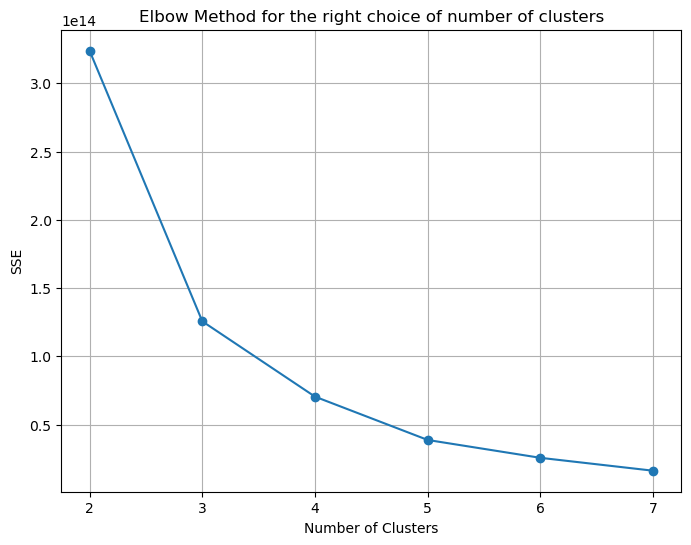

In [76]:
num_clusters = list(range(2, 8))

# Compute inertia for each cluster
inertia = []
for n_clusters in num_clusters:
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    kmeans.fit(cities_incidents[['population']])
    inertia.append(kmeans.inertia_)

# Plot the inertia's values for each cluster
plt.figure(figsize=(8, 6))
plt.plot(num_clusters, inertia, marker='o')
plt.title('Elbow Method for the right choice of number of clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')
plt.grid()
plt.show()

We then see that the right number of clusters is 4. We then calculate the **k-Means** with k=4.

In [77]:
#ignore the warnings of "SettingWithCopyWarning"
pd.options.mode.chained_assignment = None  

n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, n_init=20)
cities_incidents['cluster'] = kmeans.fit_predict(cities_incidents[['population']])

cities_incidents.head()

,state,city_or_county,population,incidents_city,incidents_city_ratio,cluster
0,Indiana,Indianapolis,1659305.0,1344,8.099777,3
1,District of Columbia,Washington,4810669.0,1304,2.710642,2
2,Pennsylvania,Pittsburgh,1720279.0,739,4.295815,3
3,Connecticut,New Haven,587648.0,344,5.853844,0
4,Oklahoma,Tulsa,715983.0,784,10.949981,0


We move on again to group the data along clusters. For the numeric columns that we cluster, we decide to set the value as the mean of the cluster values.

In [78]:
result = cities_incidents.groupby('cluster').agg({
    'city_or_county': set,  #converts occurrences of "state" to a set
    'population': 'mean',  #compute the median of "latitude"
    'incidents_city': 'mean',
    'incidents_city_ratio': 'mean',
}).reset_index()

#Name and sort the columns of result dataframe
result.columns = ['cluster', 'city_or_county', 'population', 'incidents_city', 'incidents_city_ratio']
result = result.sort_values(by='population')
result.reset_index(drop=True, inplace=True)

display(result)

,cluster,city_or_county,population,incidents_city,incidents_city_ratio
0,0,"{Norwalk, Menifee, Kenner, Eau Claire, Lauderh...",2.003304e+05,116.367505,5.171530
1,3,"{Virginia Beach, Kansas City, Charlotte, Austi...",2.037618e+06,768.964286,4.231654
2,2,"{Chicago, Phoenix, Philadelphia, Dallas, Atlan...",5.472441e+06,2154.666667,3.372859
3,1,"{New York, Los Angeles}",1.554706e+07,434.500000,0.356972


At this point we move on to change the name of the clusters to make them more meaningful. Since we have clusterrized to divide the different cities into various orders of magnitude, we will rename the clusters respectively like this:
- **town**: will be the cluster with the lowest average population;
- **small city**: will be the cluster with population mean greater than town but less than city;
- **city**: will be the second cluster with higher population average;
- **big city**: will be the cluster with the highest population average.

In [79]:
#create a new column "town_size" with initial values set to "unknown"
result['town_size'] = 'unknown'
result.loc[result.index == 0, 'town_size'] = 'town'
result.loc[result.index == 1, 'town_size'] = 'small city'
result.loc[result.index == 2, 'town_size'] = 'city'
result.loc[result.index == 3, 'town_size'] = 'big city'

result = result[['cluster', 'town_size'] + [col for col in result.columns if col not in ['cluster', 'town_size']]]

result.drop(columns=['cluster'], inplace=True)

result.head()


,town_size,city_or_county,population,incidents_city,incidents_city_ratio
0,town,"{Norwalk, Menifee, Kenner, Eau Claire, Lauderh...",2.003304e+05,116.367505,5.171530
1,small city,"{Virginia Beach, Kansas City, Charlotte, Austi...",2.037618e+06,768.964286,4.231654
2,city,"{Chicago, Phoenix, Philadelphia, Dallas, Atlan...",5.472441e+06,2154.666667,3.372859
3,big city,"{New York, Los Angeles}",1.554706e+07,434.500000,0.356972


Finally we print a bar graph and a scatter plot to show the results. Against what we expected, the bar graph shows us that it is not the cities with the largest populations that have the most accidents on average, but rather those with the least population. In fact it shows us a fairly clear trend: the average number of accidents goes down as population increases. So large cities, which are often considered the most dangerous, have fewer accidents per capita than small cities. We can therefore conclude that the two columns *population* and *incidents_city_ratio* are inversely proportional, as we can better see in the scatter plot.

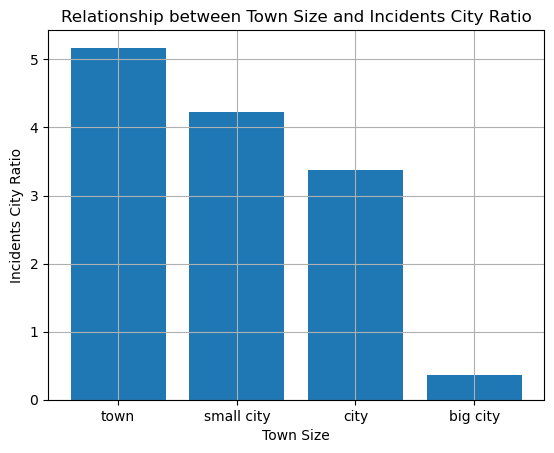

In [80]:
import matplotlib.pyplot as plt

#creates a bar graph
plt.bar(result["town_size"], result["incidents_city_ratio"])

#add labels and titles
plt.xlabel("Town Size")
plt.ylabel("Incidents City Ratio")
plt.title("Relationship between Town Size and Incidents City Ratio")
plt.grid(True)

plt.show()


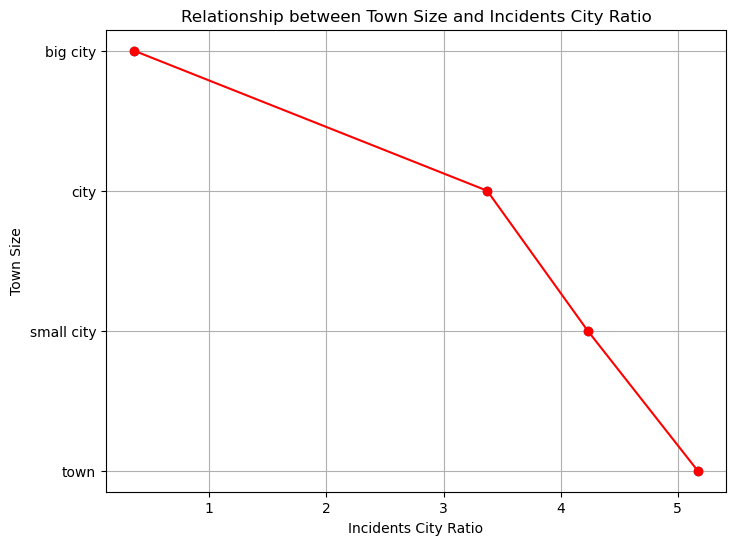

In [81]:
plt.figure(figsize=(8, 6))
plt.scatter(result["incidents_city_ratio"], result["town_size"])
plt.plot(result["incidents_city_ratio"], result["town_size"], linestyle='-', marker='o', color='red')
plt.title("Relationship between Town Size and Incidents City Ratio")
plt.xlabel("Incidents City Ratio")
plt.ylabel("Town Size")
#plt.legend()

plt.grid(True)
plt.show()


# Geo Data Visualization

The idea would be to represent on a map of the U.S. and in a simple graphical way which cities and states are the most dangerous. For cities, the idea would be to use a clustering algorithm, using a metric that takes into account latitude and longitude. For states, on the other hand, just merge the data for each state, counting how many instances of each state appear.

## Data creation and cleaning.

At first we need to create the subtable that we are interested in and do some preliminary cleaning. In fact, at first we can eliminate all rows that do not have latitude and longitude information, since they cannot be represented graphically. 

In [82]:
geo_incidents=join_dataframe[['state', 'city_or_county', 'latitude', 'longitude']]

#check that there are no null valus in dataframe
geo_incidents.isnull().sum()

state             0
city_or_county    0
latitude          0
longitude         0
dtype: int64

In addition, in the cleaning part we had already removed the 4 data points that represented outliers - in fact, through a graphic visualization, you could see how those points fell on Chinese soil. 

## Geo Visualization by cities

We then begin by wanting to give a graphical representation of the number of accidents that occur in each city. We first create a table in which we merge all the occurrences of incidents that happen in the same city and create a new column, called **number_of_incidents**, that counts for each city how many times it was present in the original dataframe - i.e., how many crimes occurred in that city. At this point we also update the **latitude** and **longitude** columns, taking for each city as its latitude - and likewise as its longitude - the median of all the latitudes associated with that specific city in the original dataframe. We take the median and not the mean because we would like a point that geographically reflects the center of the city.

In [83]:
# Calculate the incident count for each 'state' and 'city_or_county' pair.
city_state_incidents = geo_incidents.groupby(['city_or_county', 'state'])['latitude'].count().reset_index()

# Rename the 'latitude' column to 'number_of_incidents'
city_state_incidents.rename(columns={'latitude': 'number_of_incidents'}, inplace=True)


average_location = geo_incidents.groupby(['state', 'city_or_county'])[['latitude', 'longitude']].median().reset_index()

# Merge incident count and location information.
geo_cities_incidents = pd.merge(city_state_incidents, average_location, on=['state', 'city_or_county'])
geo_cities_incidents = geo_cities_incidents.sort_values(by='number_of_incidents', ascending=False)
geo_cities_incidents.head()


,city_or_county,state,number_of_incidents,latitude,longitude
2552,Chicago,Illinois,9660,41.8288,-87.6734
662,Baltimore,Maryland,3386,39.3048,-76.6293
10020,New Orleans,Louisiana,2580,29.9687,-90.0609
11128,Philadelphia,Pennsylvania,2571,39.9941,-75.1556
12484,Saint Louis,Missouri,1926,38.6596,-90.2433


At this point we use the **plotly** package to give a graphical representation of the data in the table above. Each city will be associated with a circle. This circle will be larger as the **number_of_incidents** referring to the city that the circle describes increases. Likewise, the colors of these circles will vary from yellow, to indicate cities with low numbers of crimes, to red, to indicate cities with more crimes.

In [84]:
import plotly.express as px

color_scale = [(0, 'yellow'), (1,'red')]
fig = px.scatter_mapbox(geo_cities_incidents, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_data=[ "city_or_county", "state", "number_of_incidents"],
                        color="number_of_incidents",
                        color_continuous_scale=color_scale,
                        size="number_of_incidents",
                        zoom=3, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Cluster creation

We now move on to the creation of the clusters. To do this we use the **k-Means** method found in the **sklearn.cluster** library. In order to use this method first it would be useful to try to figure out what the optimal number of clusters is. The idea then to figure out what is the ideal number of clusters is to use a method, called the **Elbow Method**. This involves training the k-Means model with a range of cluster values and calculating the inertia - sum of the square distances of the instances from the cluster center, so SSE - for each cluster value. Once this is done, one then looks for the point at which the inertia begins to change most slowly, creating an elbow curve. This point is considered the optimal number of clusters. In general, we will want to create a number of clusters that gives us a signficant idea of how incidents develop in the United States, so neither include too many cities, nor too few. Therefore, the range of cluster values we apply to the method is from 10 to 100.

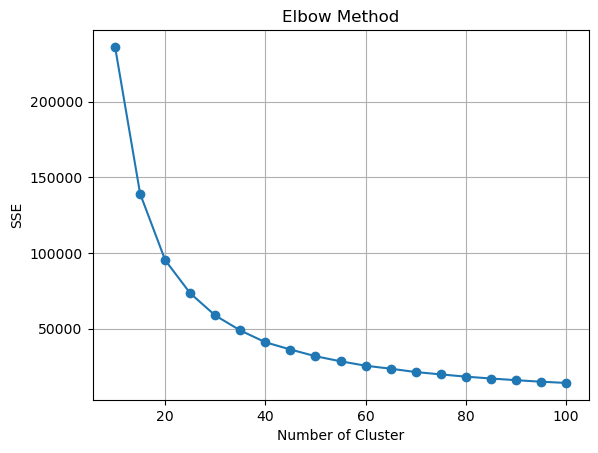

In [85]:
from sklearn.cluster import KMeans

# Select the column of latitude and longitude
coordinates = geo_cities_incidents[['latitude', 'longitude']]

inertias = []
k_values=range(10, 101, 5)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    kmeans.fit(coordinates)
    inertias.append(kmeans.inertia_)

plt.plot(k_values, inertias, marker='o')
plt.xlabel('Number of Cluster')
plt.ylabel('SSE')
plt.title("Elbow Method")
plt.grid(True)
plt.show()

Once we have then identified the best number of clusters, which would be about 42, we can apply the k-Means method one last time and obtain a clustering of our cities. We thus add to the new tables a new column in which we add the information about what number of clusters each data item belongs to.

In [86]:
#the number of cluster obtained from elbow method
num_clusters = 42  
kmeans = KMeans(n_clusters=num_clusters, random_state=0, n_init=10)
kmeans.fit(coordinates)

#add cluster labels to the original DataFrame
geo_cities_incidents['cluster'] = kmeans.labels_
geo_cities_incidents.head()


,city_or_county,state,number_of_incidents,latitude,longitude,cluster
2552,Chicago,Illinois,9660,41.8288,-87.6734,22
662,Baltimore,Maryland,3386,39.3048,-76.6293,40
10020,New Orleans,Louisiana,2580,29.9687,-90.0609,4
11128,Philadelphia,Pennsylvania,2571,39.9941,-75.1556,17
12484,Saint Louis,Missouri,1926,38.6596,-90.2433,23


At this point we create a new dataframe from **geo_city_incidents** in which we simply group all the data belonging to the same cluster. For each cluster we set as *latitude* - and therefore as *longitude* - the median of all the "latitudes" in the data that belong to the cluster. Also as *number_of_incidents* the sum of all *number_of_incidents* present in the cities that belong to the cluster.

In [87]:
# Raggruppa il DataFrame originale 'df' per il numero di cluster
grouped = geo_cities_incidents.groupby('cluster')

# Calcola la somma di "number_of_incidents" per ciascun cluster
sum_incidents = grouped['number_of_incidents'].sum()

# Calcola la mediana di latitudine e longitudine per ciascun cluster
median_latitude = grouped['latitude'].median()
median_longitude = grouped['longitude'].median()

# Crea un nuovo DataFrame con le colonne richieste
new_geo_cities_incidents = pd.DataFrame({
    'cluster': sum_incidents.index,
    'number_of_incidents': sum_incidents.values,
    'latitude': median_latitude.values,
    'longitude': median_longitude.values
})

new_geo_cities_incidents

# Ora 'new_geo_cities_incidents' contiene il nuovo DataFrame con le colonne richieste

,cluster,number_of_incidents,latitude,longitude
0,0,3530,41.472650,-94.509125
1,1,5771,35.640650,-78.810500
2,2,7252,34.031925,-117.987250
3,3,97,61.536300,-160.490500
4,4,7780,30.701475,-90.245225
5,5,3514,46.660300,-122.362000
6,6,3045,42.654700,-77.476300
7,7,226,20.887300,-156.384000
8,8,6051,42.554850,-84.222025
9,9,1894,34.073700,-105.658000


Finally we can move on to printing the result obtained on the map of the United States, exactly as we had printed previously for the cities.

In [88]:
color_scale = [(0, 'yellow'), (1,'red')]
fig = px.scatter_mapbox(new_geo_cities_incidents, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_data=[ "cluster", "number_of_incidents"],
                        color="number_of_incidents",
                        color_continuous_scale=color_scale,
                        size="number_of_incidents",
                        zoom=3, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Geo Visualization by states.

Now we move to visualize the incidents refferred to states. We have already seen previously, in data cleaning, that the number of states is exact.

At this point so we create a table containing only 51 rows. In fact, we will take the previously created **geo_cities_incidents** DataFrame and merge all rows that report information about crimes that occurred in the same state. We also update the *number_of_incidents* column, which counts the sum of the number of crimes that occurred in all cities for each state.

Finally, we associate these two columns with two other columns containing *latitude* and *longitude* information. With each state we associate as latitude - and equivalently longitude - the median of all latitudes in **geo_cities_incidents** that relate to the same state. We take the median and not the mean because we want to get a point that is geographically in the center of the state, thus not having to count if more crimes occur at one point in the same state than at another point.

In [89]:
state_incidents = geo_cities_incidents.groupby('state')['number_of_incidents'].sum().reset_index()
state_incidents.columns = ['state', 'number_of_incidents']
average_location_state = geo_cities_incidents.groupby('state')[['latitude', 'longitude']].median().reset_index()
geo_state_incidents=pd.merge(state_incidents, average_location_state, on='state')
geo_state_incidents


,state,number_of_incidents,latitude,longitude
0,Alabama,4365,33.217450,-86.667950
1,Alaska,836,61.542200,-151.311000
2,Arizona,1775,33.504575,-111.786500
3,Arkansas,2210,35.204450,-92.440500
4,California,12696,36.292800,-119.708000
5,Colorado,1892,39.490550,-105.102000
6,Connecticut,2379,41.564625,-72.675350
7,Delaware,1442,39.178800,-75.576300
8,District of Columbia,1308,38.858900,-77.003200
9,Florida,10542,28.304150,-81.731300


Finally we use **plotly** in the same way we did above in the case of cities to get the following result.

In [90]:
color_scale = [(0, 'yellow'), (1,'red')]
fig = px.scatter_mapbox(geo_state_incidents, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_data=[ "state", "number_of_incidents"],
                        color="number_of_incidents",
                        color_continuous_scale=color_scale,
                        size="number_of_incidents",
                        zoom=3, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()